In [1]:
import fastf1
import pandas as pd
import seaborn as sns
import numpy as np
import xgboost as xgb
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score



# Function to load all lap data for a season
def load_grand_prix_laps_data(year):
    all_laps = pd.DataFrame()  # DataFrame to collect all lap data

    # List of Grand Prix names for the given season (the 2024 season in this case)
    grand_prix_names = [
        "Bahrain", "Jeddah", "Melbourne", "Suzuka", "Shanghai", "Miami", "Imola", "Monaco",
        "Montreal", "Barcelona", "Spielberg", "Silverstone", "Hungaroring", "Spa", "Zandvoort", "Monza",
        "Baku", "Singapore", "Austin", "Mexico City", "São Paulo", "Las Vegas", "Losail", "Abu Dhabi"
    ]


    for gp_name in grand_prix_names:
        try:
            print(f"Loading data for {gp_name}...")
            # Load the race session ('R' for Race) for each Grand Prix
            session = fastf1.get_session(year, gp_name, 'R')
            session.load()  # Load session data

            # Retrieve the lap data for this session
            laps = session.laps

            # Add a column for the Grand Prix name to the laps data
            laps['GrandPrix'] = gp_name

            # Add lap data to our global DataFrame
            all_laps = pd.concat([all_laps, laps], ignore_index=True)

        except Exception as e:
            print(f"Error loading data for {gp_name}: {e}")

    return all_laps


# Load all data for the 2024 season
year = 2024
data = load_grand_prix_laps_data(year)

# Check the retrieved columns
print(data.head())  # Display the first few rows to view the data

# Save the data to a CSV file
data.to_csv('grand_prix_laps_data_2024.csv', index=False)
print("The data has been saved in 'grand_prix_laps_data_2024.csv'.")

req         WARNING 	DEFAULT CACHE ENABLED! (3.12 GB) /home/sepanta/.cache/fastf1


Loading data for Bahrain...


core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '55', '16', '63', '4', '44', '81', '14', '18', '24', '20', '3', '22', '23', '27', '31', '10', '77', '2']
core           INFO 	Loading data for Saudi Arabian Grand Prix

Loading data for Jeddah...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '16', '81', '14', '63', '38', '4', '44', '27', '23', '20', '31', '2', '22', '3', '77', '24', '18', '10']
core           INFO 	Loading data for Australian Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Melbourne...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 19 drivers: ['55', '16', '4', '81', '11', '18', '22', '14', '27', '20', '23', '3', '10', '77', '24', '31', '63', '44', '1']
core           INFO 	Loading data for Japanese Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Suzuka...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '55', '16', '4', '14', '63', '81', '44', '22', '27', '18', '20', '77', '31', '10', '2', '24', '3', '23']
core           INFO 	Loading data for Chinese Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Shanghai...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core        WARNING 	Driver 1 completed the race distance 00:08.313000 before the recorded end of the session.
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '11', '16', '55', '63', '14', '81', '44', '27', '31', '23', '10', '24', '18', '20', '2', '3', '22', '77']
core           INFO 	Loading data for Miami Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data


Loading data for Miami...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '16', '11', '55', '44', '22', '63', '14', '31', '27', '10', '81', '24', '3', '77', '18', '23', '20', '2']
core           INFO 	Loading data for Emilia Romagna Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Imola...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '16', '81', '55', '44', '63', '11', '18', '22', '27', '20', '3', '31', '24', '10', '2', '77', '14', '23']
core           INFO 	Loading data for Monaco Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Monaco...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '81', '55', '4', '63', '1', '44', '22', '23', '10', '14', '3', '77', '18', '2', '24', '31', '11', '27', '20']
events      WARNING 	Correcting user input 'Montreal' to 'Canadian Grand Prix'
core           INFO 	Loading data for Canadian Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processi

Loading data for Montreal...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '63', '44', '81', '14', '18', '3', '10', '31', '27', '20', '77', '22', '24', '55', '23', '11', '16', '2']
core           INFO 	Loading data for Spanish Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Barcelona...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core        WARNING 	Driver 1 completed the race distance 00:00.015000 before the recorded end of the session.
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '44', '63', '16', '55', '81', '11', '10', '31', '27', '14', '24', '18', '3', '77', '20', '23', '22', '2']
core           INFO 	Loading data for Austrian Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_da

Loading data for Spielberg...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['63', '81', '55', '44', '1', '27', '11', '20', '3', '10', '16', '31', '18', '22', '23', '77', '24', '14', '2', '4']
core           INFO 	Loading data for British Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Silverstone...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['44', '1', '4', '81', '55', '27', '18', '14', '23', '22', '2', '20', '3', '16', '77', '31', '11', '24', '63', '10']
events      WARNING 	Correcting user input 'Hungaroring' to 'Hungarian Grand Prix'
core           INFO 	Loading data for Hungarian Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Pro

Loading data for Hungaroring...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['81', '4', '44', '16', '1', '55', '11', '63', '22', '18', '14', '3', '27', '23', '20', '77', '2', '31', '24', '10']
events      WARNING 	Correcting user input 'Spa' to 'Spanish Grand Prix'
core           INFO 	Loading data for Spanish Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timi

Loading data for Spa...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core        WARNING 	Driver 1 completed the race distance 00:00.015000 before the recorded end of the session.
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '44', '63', '16', '55', '81', '11', '10', '31', '27', '14', '24', '18', '3', '77', '20', '23', '22', '2']
core           INFO 	Loading data for Dutch Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data


Loading data for Zandvoort...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '16', '81', '55', '11', '63', '44', '10', '14', '27', '3', '18', '23', '31', '2', '22', '20', '77', '24']
core           INFO 	Loading data for Italian Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Monza...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '81', '4', '55', '44', '1', '63', '11', '23', '20', '14', '43', '3', '31', '10', '77', '27', '24', '18', '22']
core           INFO 	Loading data for Azerbaijan Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Baku...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['81', '16', '63', '4', '1', '14', '23', '43', '44', '50', '27', '10', '3', '24', '31', '77', '11', '55', '18', '22']
core           INFO 	Loading data for Singapore Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Singapore...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '81', '63', '16', '44', '55', '14', '27', '11', '43', '22', '31', '18', '24', '77', '10', '3', '20', '23']
core           INFO 	Loading data for United States Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Austin...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '55', '1', '4', '81', '63', '11', '27', '30', '43', '20', '10', '14', '22', '18', '23', '77', '31', '24', '44']
core           INFO 	Loading data for Mexico City Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for Mexico City...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['55', '4', '16', '44', '63', '1', '20', '81', '27', '10', '18', '43', '31', '77', '24', '30', '11', '14', '23', '22']
core           INFO 	Loading data for São Paulo Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...


Loading data for São Paulo...


core        WARNING 	No lap data for driver 23
core        WARNING 	Failed to perform lap accuracy check - all laps marked as inaccurate (driver 23)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '31', '10', '63', '16', '4', '22', '81', '30', '44', '11', '50', '77', '14', '24', '55', '43', '23', '18', '27']
core           INFO 	Loading data for Las Vegas Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            

Loading data for Las Vegas...


core        WARNING 	Driver 63: Lap timing integrity check failed for 2 lap(s)
core        WARNING 	Driver 44: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver 55: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver 16: Lap timing integrity check failed for 2 lap(s)
core        WARNING 	Driver  1: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver  4: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver 81: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver 30: Lap timing integrity check failed for 2 lap(s)
core        WARNING 	Driver 77: Lap timing integrity check failed for 2 lap(s)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core        WARNING 	Driver 63 completed the race distance 

Loading data for Losail...


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '81', '63', '10', '55', '14', '24', '20', '4', '77', '44', '22', '30', '23', '27', '11', '18', '43', '31']
core           INFO 	Loading data for Abu Dhabi Grand Prix - Race [v3.5.3]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_

Loading data for Abu Dhabi...


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '55', '16', '44', '63', '1', '10', '27', '14', '81', '23', '22', '24', '18', '61', '20', '30', '77', '43', '11']


                    Time Driver DriverNumber                LapTime  \
0 0 days 01:01:37.489000    VER            1 0 days 00:01:37.284000   
1 0 days 01:03:13.785000    VER            1 0 days 00:01:36.296000   
2 0 days 01:04:50.538000    VER            1 0 days 00:01:36.753000   
3 0 days 01:06:27.185000    VER            1 0 days 00:01:36.647000   
4 0 days 01:08:04.358000    VER            1 0 days 00:01:37.173000   

   LapNumber  Stint PitOutTime PitInTime            Sector1Time  \
0        1.0    1.0        NaT       NaT                    NaT   
1        2.0    1.0        NaT       NaT 0 days 00:00:30.916000   
2        3.0    1.0        NaT       NaT 0 days 00:00:30.999000   
3        4.0    1.0        NaT       NaT 0 days 00:00:30.931000   
4        5.0    1.0        NaT       NaT 0 days 00:00:31.255000   

             Sector2Time  ...             Team           LapStartTime  \
0 0 days 00:00:41.266000  ...  Red Bull Racing 0 days 00:59:59.911000   
1 0 days 00:00:41.661000

In [2]:
# Now let's load the CSV into a DataFrame to manipulate the data
df = pd.read_csv('grand_prix_laps_data_2024.csv')

# Display the first few rows of the data
print(df.head())

                     Time Driver  DriverNumber                 LapTime  \
0  0 days 01:01:37.489000    VER             1  0 days 00:01:37.284000   
1  0 days 01:03:13.785000    VER             1  0 days 00:01:36.296000   
2  0 days 01:04:50.538000    VER             1  0 days 00:01:36.753000   
3  0 days 01:06:27.185000    VER             1  0 days 00:01:36.647000   
4  0 days 01:08:04.358000    VER             1  0 days 00:01:37.173000   

   LapNumber  Stint PitOutTime PitInTime             Sector1Time  \
0        1.0    1.0        NaN       NaN                     NaN   
1        2.0    1.0        NaN       NaN  0 days 00:00:30.916000   
2        3.0    1.0        NaN       NaN  0 days 00:00:30.999000   
3        4.0    1.0        NaN       NaN  0 days 00:00:30.931000   
4        5.0    1.0        NaN       NaN  0 days 00:00:31.255000   

              Sector2Time  ...             Team            LapStartTime  \
0  0 days 00:00:41.266000  ...  Red Bull Racing  0 days 00:59:59.911000

In [3]:
# Statistical summary of numerical data
print(df.describe())

       DriverNumber     LapNumber         Stint       SpeedI1       SpeedI2  \
count  27075.000000  27075.000000  27075.000000  22912.000000  27021.000000   
mean      28.959852     30.893075      2.002216    253.335414    250.194996   
std       23.832150     18.386895      0.874859     43.176958     43.003864   
min        1.000000      1.000000      1.000000     59.000000     57.000000   
25%       11.000000     15.000000      1.000000    214.000000    222.000000   
50%       22.000000     30.000000      2.000000    271.000000    260.000000   
75%       44.000000     46.000000      3.000000    288.000000    280.000000   
max       81.000000     78.000000      5.000000    340.000000    343.000000   

            SpeedFL       SpeedST      TyreLife   TrackStatus      Position  
count  26190.000000  24907.000000  27075.000000  27075.000000  27047.000000  
mean     270.132302    296.680371     15.025743      6.921847      9.817096  
std       33.352287     31.544881     11.197923     66

In [4]:
# Data types of columns
print(df.dtypes)

Time                   object
Driver                 object
DriverNumber            int64
LapTime                object
LapNumber             float64
Stint                 float64
PitOutTime             object
PitInTime              object
Sector1Time            object
Sector2Time            object
Sector3Time            object
Sector1SessionTime     object
Sector2SessionTime     object
Sector3SessionTime     object
SpeedI1               float64
SpeedI2               float64
SpeedFL               float64
SpeedST               float64
IsPersonalBest         object
Compound               object
TyreLife              float64
FreshTyre                bool
Team                   object
LapStartTime           object
LapStartDate           object
TrackStatus             int64
Position              float64
Deleted                  bool
DeletedReason          object
FastF1Generated          bool
IsAccurate               bool
GrandPrix              object
dtype: object


In [5]:
# Checking for missing values
print(df.isnull().sum())

Time                      0
Driver                    0
DriverNumber              0
LapTime                 224
LapNumber                 0
Stint                     0
PitOutTime            26226
PitInTime             26219
Sector1Time             540
Sector2Time              31
Sector3Time              53
Sector1SessionTime      600
Sector2SessionTime       31
Sector3SessionTime       53
SpeedI1                4163
SpeedI2                  54
SpeedFL                 885
SpeedST                2168
IsPersonalBest           15
Compound                  0
TyreLife                  0
FreshTyre                 0
Team                      0
LapStartTime              0
LapStartDate             15
TrackStatus               0
Position                 28
Deleted                   0
DeletedReason         26745
FastF1Generated           0
IsAccurate                0
GrandPrix                 0
dtype: int64


In [6]:
# Convert LapTime to timedelta
df['LapTime'] = pd.to_timedelta(df['LapTime'], errors='coerce')

# Check missing values after conversion
print(df['LapTime'].isnull().sum())

# Convert LapTime to seconds for mean calculation
df['LapTime_seconds'] = df['LapTime'].dt.total_seconds()

# Compute the average lap time per Driver and Grand Prix
mean_lap_times = df.groupby(['Driver', 'GrandPrix'])['LapTime_seconds'].mean().reset_index()

# Merge the mean lap times back into the original dataframe
df = df.merge(mean_lap_times, on=['Driver', 'GrandPrix'], suffixes=('', '_mean'))

# Replace missing LapTime_seconds with the computed mean
df['LapTime_seconds'] = df['LapTime_seconds'].fillna(df['LapTime_seconds_mean'])

# Drop the temporary mean column
df = df.drop(columns=['LapTime_seconds_mean'])

# Convert back to timedelta
df['LapTime'] = pd.to_timedelta(df['LapTime_seconds'], unit='s')

# Drop the temporary seconds column
df = df.drop(columns=['LapTime_seconds'])

# Verify if there are still missing values
print(df.isnull().sum())

224
Time                      0
Driver                    0
DriverNumber              0
LapTime                  13
LapNumber                 0
Stint                     0
PitOutTime            26226
PitInTime             26219
Sector1Time             540
Sector2Time              31
Sector3Time              53
Sector1SessionTime      600
Sector2SessionTime       31
Sector3SessionTime       53
SpeedI1                4163
SpeedI2                  54
SpeedFL                 885
SpeedST                2168
IsPersonalBest           15
Compound                  0
TyreLife                  0
FreshTyre                 0
Team                      0
LapStartTime              0
LapStartDate             15
TrackStatus               0
Position                 28
Deleted                   0
DeletedReason         26745
FastF1Generated           0
IsAccurate                0
GrandPrix                 0
dtype: int64


In [7]:
# Drop rows where 'LapTime' is missing
df = df.dropna(subset=['LapTime'])

# Verify the result
print(df.isnull().sum())

Time                      0
Driver                    0
DriverNumber              0
LapTime                   0
LapNumber                 0
Stint                     0
PitOutTime            26213
PitInTime             26206
Sector1Time             527
Sector2Time              18
Sector3Time              40
Sector1SessionTime      587
Sector2SessionTime       18
Sector3SessionTime       40
SpeedI1                4150
SpeedI2                  41
SpeedFL                 872
SpeedST                2155
IsPersonalBest           15
Compound                  0
TyreLife                  0
FreshTyre                 0
Team                      0
LapStartTime              0
LapStartDate             15
TrackStatus               0
Position                 15
Deleted                   0
DeletedReason         26732
FastF1Generated           0
IsAccurate                0
GrandPrix                 0
dtype: int64


In [8]:
# Convert Sector times to timedelta if they aren't already
df['Sector1Time'] = pd.to_timedelta(df['Sector1Time'], errors='coerce')
df['Sector2Time'] = pd.to_timedelta(df['Sector2Time'], errors='coerce')
df['Sector3Time'] = pd.to_timedelta(df['Sector3Time'], errors='coerce')

# Convert Sector times to seconds for mean calculation
df['Sector1Time_seconds'] = df['Sector1Time'].dt.total_seconds()
df['Sector2Time_seconds'] = df['Sector2Time'].dt.total_seconds()
df['Sector3Time_seconds'] = df['Sector3Time'].dt.total_seconds()

# Compute the mean sector times per Driver and Grand Prix
mean_sector_times = df.groupby(['Driver', 'GrandPrix'])[
    ['Sector1Time_seconds', 'Sector2Time_seconds', 'Sector3Time_seconds']
].mean().reset_index()

# Merge the mean sector times back into the original dataframe
df = df.merge(mean_sector_times, on=['Driver', 'GrandPrix'], suffixes=('', '_mean'))

# Replace missing values with the computed mean
df['Sector1Time_seconds'] = df['Sector1Time_seconds'].fillna(df['Sector1Time_seconds_mean'])
df['Sector2Time_seconds'] = df['Sector2Time_seconds'].fillna(df['Sector2Time_seconds_mean'])
df['Sector3Time_seconds'] = df['Sector3Time_seconds'].fillna(df['Sector3Time_seconds_mean'])

# Drop temporary mean columns
df.drop(columns=['Sector1Time_seconds_mean', 'Sector2Time_seconds_mean', 'Sector3Time_seconds_mean'], inplace=True)

# Convert back to timedelta
df['Sector1Time'] = pd.to_timedelta(df['Sector1Time_seconds'], unit='s')
df['Sector2Time'] = pd.to_timedelta(df['Sector2Time_seconds'], unit='s')
df['Sector3Time'] = pd.to_timedelta(df['Sector3Time_seconds'], unit='s')

# Drop the temporary seconds columns
df.drop(columns=['Sector1Time_seconds', 'Sector2Time_seconds', 'Sector3Time_seconds'], inplace=True)

# Verify the result
print(df.isnull().sum())

Time                      0
Driver                    0
DriverNumber              0
LapTime                   0
LapNumber                 0
Stint                     0
PitOutTime            26213
PitInTime             26206
Sector1Time               3
Sector2Time               0
Sector3Time               0
Sector1SessionTime      587
Sector2SessionTime       18
Sector3SessionTime       40
SpeedI1                4150
SpeedI2                  41
SpeedFL                 872
SpeedST                2155
IsPersonalBest           15
Compound                  0
TyreLife                  0
FreshTyre                 0
Team                      0
LapStartTime              0
LapStartDate             15
TrackStatus               0
Position                 15
Deleted                   0
DeletedReason         26732
FastF1Generated           0
IsAccurate                0
GrandPrix                 0
dtype: int64


In [9]:
# Drop rows where 'Sector1Time' is missing
df = df.dropna(subset=['Sector1Time'])

# Verify the result
print(df.isnull().sum())

Time                      0
Driver                    0
DriverNumber              0
LapTime                   0
LapNumber                 0
Stint                     0
PitOutTime            26210
PitInTime             26204
Sector1Time               0
Sector2Time               0
Sector3Time               0
Sector1SessionTime      584
Sector2SessionTime       17
Sector3SessionTime       39
SpeedI1                4149
SpeedI2                  40
SpeedFL                 870
SpeedST                2154
IsPersonalBest           14
Compound                  0
TyreLife                  0
FreshTyre                 0
Team                      0
LapStartTime              0
LapStartDate             14
TrackStatus               0
Position                 14
Deleted                   0
DeletedReason         26729
FastF1Generated           0
IsAccurate                0
GrandPrix                 0
dtype: int64


In [10]:
# Convert Sector session times to timedelta
df['Sector1SessionTime'] = pd.to_timedelta(df['Sector1SessionTime'], errors='coerce')
df['Sector2SessionTime'] = pd.to_timedelta(df['Sector2SessionTime'], errors='coerce')
df['Sector3SessionTime'] = pd.to_timedelta(df['Sector3SessionTime'], errors='coerce')

# Convert timedelta to total seconds for mean calculation
df['Sector1SessionTime_seconds'] = df['Sector1SessionTime'].dt.total_seconds()
df['Sector2SessionTime_seconds'] = df['Sector2SessionTime'].dt.total_seconds()
df['Sector3SessionTime_seconds'] = df['Sector3SessionTime'].dt.total_seconds()

# Compute the mean sector session times per Driver and Grand Prix
mean_sector_times = df.groupby(['Driver', 'GrandPrix'])[
    ['Sector1SessionTime_seconds', 'Sector2SessionTime_seconds', 'Sector3SessionTime_seconds']
].mean().reset_index()

# Merge the mean sector session times back into the original dataframe
df = df.merge(mean_sector_times, on=['Driver', 'GrandPrix'], suffixes=('', '_mean'))

# Replace missing values with the computed mean
df['Sector1SessionTime_seconds'] = df['Sector1SessionTime_seconds'].fillna(df['Sector1SessionTime_seconds_mean'])
df['Sector2SessionTime_seconds'] = df['Sector2SessionTime_seconds'].fillna(df['Sector2SessionTime_seconds_mean'])
df['Sector3SessionTime_seconds'] = df['Sector3SessionTime_seconds'].fillna(df['Sector3SessionTime_seconds_mean'])

# Drop temporary mean columns
df.drop(columns=['Sector1SessionTime_seconds_mean', 'Sector2SessionTime_seconds_mean', 'Sector3SessionTime_seconds_mean'], inplace=True)

# Convert back to timedelta
df['Sector1SessionTime'] = pd.to_timedelta(df['Sector1SessionTime_seconds'], unit='s')
df['Sector2SessionTime'] = pd.to_timedelta(df['Sector2SessionTime_seconds'], unit='s')
df['Sector3SessionTime'] = pd.to_timedelta(df['Sector3SessionTime_seconds'], unit='s')

# Drop the temporary seconds columns
df.drop(columns=['Sector1SessionTime_seconds', 'Sector2SessionTime_seconds', 'Sector3SessionTime_seconds'], inplace=True)

# Verify the result
print(df.isnull().sum())

Time                      0
Driver                    0
DriverNumber              0
LapTime                   0
LapNumber                 0
Stint                     0
PitOutTime            26210
PitInTime             26204
Sector1Time               0
Sector2Time               0
Sector3Time               0
Sector1SessionTime        0
Sector2SessionTime        0
Sector3SessionTime        0
SpeedI1                4149
SpeedI2                  40
SpeedFL                 870
SpeedST                2154
IsPersonalBest           14
Compound                  0
TyreLife                  0
FreshTyre                 0
Team                      0
LapStartTime              0
LapStartDate             14
TrackStatus               0
Position                 14
Deleted                   0
DeletedReason         26729
FastF1Generated           0
IsAccurate                0
GrandPrix                 0
dtype: int64


In [11]:
# List of time-related columns
time_columns = [
    'Time', 'LapTime', 'PitOutTime', 'PitInTime',
    'Sector1Time', 'Sector2Time', 'Sector3Time',
    'Sector1SessionTime', 'Sector2SessionTime', 'Sector3SessionTime',
    'LapStartTime'
]

# Convert all object-type time columns to timedelta first
for col in time_columns:
    if df[col].dtype == 'object':
        df[col] = pd.to_timedelta(df[col], errors='coerce')

    if pd.api.types.is_timedelta64_dtype(df[col]):
        df[col] = df[col].dt.total_seconds()

# Verify the result
print(df[time_columns].head())  # Only display the converted time columns

       Time  LapTime  PitOutTime  PitInTime  Sector1Time  Sector2Time  \
0  3697.489   97.284         NaN        NaN    31.408018       41.266   
1  3793.785   96.296         NaN        NaN    30.916000       41.661   
2  3890.538   96.753         NaN        NaN    30.999000       41.966   
3  3987.185   96.647         NaN        NaN    30.931000       41.892   
4  4084.358   97.173         NaN        NaN    31.255000       42.056   

   Sector3Time  Sector1SessionTime  Sector2SessionTime  Sector3SessionTime  \
0       23.616         6398.483607            3673.987            3697.669   
1       23.719         3728.426000            3770.087            3793.806   
2       23.788         3824.805000            3866.771            3890.559   
3       23.824         3921.490000            3963.382            3987.206   
4       23.862         4018.461000            4060.517            4084.379   

   LapStartTime  
0      3599.911  
1      3697.489  
2      3793.785  
3      3890.538  
4 

In [12]:
# Data types of columns
print(df.dtypes)

Time                  float64
Driver                 object
DriverNumber            int64
LapTime               float64
LapNumber             float64
Stint                 float64
PitOutTime            float64
PitInTime             float64
Sector1Time           float64
Sector2Time           float64
Sector3Time           float64
Sector1SessionTime    float64
Sector2SessionTime    float64
Sector3SessionTime    float64
SpeedI1               float64
SpeedI2               float64
SpeedFL               float64
SpeedST               float64
IsPersonalBest         object
Compound               object
TyreLife              float64
FreshTyre                bool
Team                   object
LapStartTime          float64
LapStartDate           object
TrackStatus             int64
Position              float64
Deleted                  bool
DeletedReason          object
FastF1Generated          bool
IsAccurate               bool
GrandPrix              object
dtype: object


In [13]:
# Fill missing values for SpeedI1, SpeedI2, SpeedFL, SpeedST with the mean for each Driver and GrandPrix
df['SpeedI1'] = df.groupby(['Driver', 'GrandPrix'])['SpeedI1'].transform(lambda x: x.fillna(x.mean()))
df['SpeedI2'] = df.groupby(['Driver', 'GrandPrix'])['SpeedI2'].transform(lambda x: x.fillna(x.mean()))
df['SpeedFL'] = df.groupby(['Driver', 'GrandPrix'])['SpeedFL'].transform(lambda x: x.fillna(x.mean()))
df['SpeedST'] = df.groupby(['Driver', 'GrandPrix'])['SpeedST'].transform(lambda x: x.fillna(x.mean()))

# Verify the result
print(df.isnull().sum())

Time                      0
Driver                    0
DriverNumber              0
LapTime                   0
LapNumber                 0
Stint                     0
PitOutTime            26210
PitInTime             26204
Sector1Time               0
Sector2Time               0
Sector3Time               0
Sector1SessionTime        0
Sector2SessionTime        0
Sector3SessionTime        0
SpeedI1                   0
SpeedI2                   0
SpeedFL                   0
SpeedST                   0
IsPersonalBest           14
Compound                  0
TyreLife                  0
FreshTyre                 0
Team                      0
LapStartTime              0
LapStartDate             14
TrackStatus               0
Position                 14
Deleted                   0
DeletedReason         26729
FastF1Generated           0
IsAccurate                0
GrandPrix                 0
dtype: int64


In [14]:
# Remove rows where 'Position' is NaN
df = df.dropna(subset=['Position'])

In [15]:
# Convert the FreshTyre column from boolean (True/False) to integer (1.0/0.0)
df['FreshTyre'] = df['FreshTyre'].astype(float)

# Replace missing values in IsPersonalBest with False
df['IsPersonalBest'] = df['IsPersonalBest'].fillna(False)

# Convert the FreshTyre column from boolean (True/False) to integer (1.0/0.0)
df['IsPersonalBest'] = df['IsPersonalBest'].astype(float)

/tmp/ipykernel_5038/4217414943.py:5: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['IsPersonalBest'] = df['IsPersonalBest'].fillna(False)


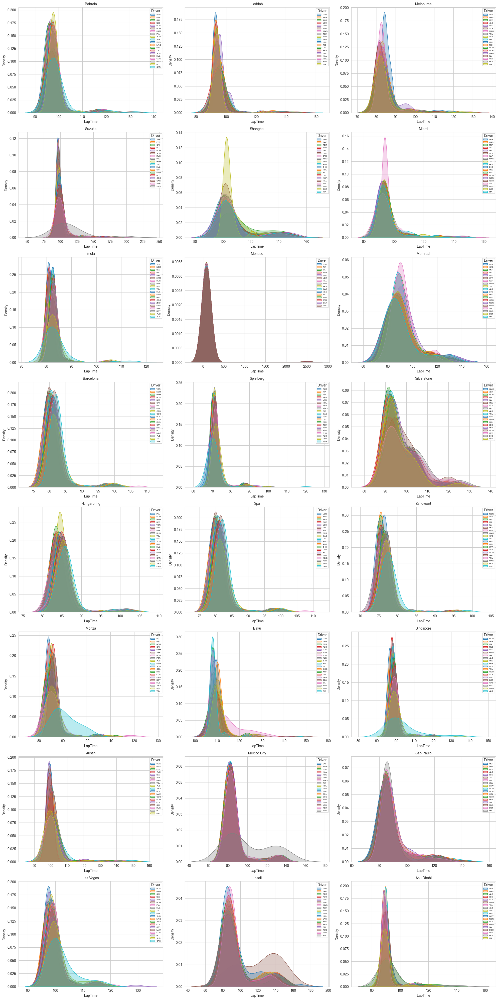

In [16]:
# Unique list of Grand Prix
grand_prix_list = df['GrandPrix'].unique()

# Create 8 rows x 3 columns subplots (24 total)
fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(20, 40))   # Adjust size if needed
axes = axes.flatten()  # Flatten to easily index subplots

for idx, gp in enumerate(grand_prix_list):
    ax = axes[idx]
    subset = df[df['GrandPrix'] == gp]

    # Plot one KDE per driver
    for driver in subset['Driver'].unique():
        driver_data = subset[subset['Driver'] == driver]
        if len(driver_data) > 1:
            sns.kdeplot(driver_data['LapTime'], ax=ax, label=driver, fill=True, alpha=0.3)

    ax.set_title(gp, fontsize=10)
    ax.set_xlabel('LapTime')
    ax.set_ylabel('Density')
    ax.legend(fontsize=6, title='Driver')

# Remove unused axes if less than 24 Grand Prix (optional safety)
for j in range(len(grand_prix_list), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [17]:
# Drop the Driver, DriverNumber, PitOutTime, PitTime, Deleted, DeletedReason, FastF1Generated, IsAccurate, LapStartDate, TrackStatus columns
df = df.drop(columns=['Driver', 'DriverNumber', 'PitOutTime', 'PitInTime', 'Deleted', 'DeletedReason', 'FastF1Generated', 'IsAccurate', 'LapStartDate', 'TrackStatus'])

# Verify the result by checking the columns of the DataFrame
print(df.columns)

Index(['Time', 'LapTime', 'LapNumber', 'Stint', 'Sector1Time', 'Sector2Time',
       'Sector3Time', 'Sector1SessionTime', 'Sector2SessionTime',
       'Sector3SessionTime', 'SpeedI1', 'SpeedI2', 'SpeedFL', 'SpeedST',
       'IsPersonalBest', 'Compound', 'TyreLife', 'FreshTyre', 'Team',
       'LapStartTime', 'Position', 'GrandPrix'],
      dtype='object')


In [18]:
# Verify the result
print(df.isnull().sum())

Time                  0
LapTime               0
LapNumber             0
Stint                 0
Sector1Time           0
Sector2Time           0
Sector3Time           0
Sector1SessionTime    0
Sector2SessionTime    0
Sector3SessionTime    0
SpeedI1               0
SpeedI2               0
SpeedFL               0
SpeedST               0
IsPersonalBest        0
Compound              0
TyreLife              0
FreshTyre             0
Team                  0
LapStartTime          0
Position              0
GrandPrix             0
dtype: int64


In [19]:
# Save the cleaned DataFrame to a new CSV file
df.to_csv('grand_prix_laps_data_2024_clean.csv', index=False)

In [20]:
# Apply One-Hot Encoding to 'Compound', 'Team', and 'GrandPrix' columns
df = pd.get_dummies(df, columns=['Compound', 'Team', 'GrandPrix'], drop_first=False)

In [21]:
# Data types of columns
print(df.dtypes)

Time                     float64
LapTime                  float64
LapNumber                float64
Stint                    float64
Sector1Time              float64
Sector2Time              float64
Sector3Time              float64
Sector1SessionTime       float64
Sector2SessionTime       float64
Sector3SessionTime       float64
SpeedI1                  float64
SpeedI2                  float64
SpeedFL                  float64
SpeedST                  float64
IsPersonalBest           float64
TyreLife                 float64
FreshTyre                float64
LapStartTime             float64
Position                 float64
Compound_HARD               bool
Compound_INTERMEDIATE       bool
Compound_MEDIUM             bool
Compound_SOFT               bool
Compound_WET                bool
Team_Alpine                 bool
Team_Aston Martin           bool
Team_Ferrari                bool
Team_Haas F1 Team           bool
Team_Kick Sauber            bool
Team_McLaren                bool
Team_Merce

               Time       LapTime   Sector1Time   Sector2Time   Sector3Time  \
count  27045.000000  27045.000000  27045.000000  27045.000000  27045.000000   
mean    6294.945577     91.686074     28.259767     34.556313     27.721475   
std     1921.659567     59.722904      6.900112      7.037640      7.401132   
min      349.596000     67.694000     16.897000     17.488000     17.690000   
25%     4810.173000     81.504000     24.076000     29.637000     23.152000   
50%     6239.485000     86.930000     27.867000     32.670000     25.592000   
75%     7684.726000     98.027000     30.833000     40.070000     31.277000   
max    12009.121000   2526.253000     97.585000     90.308000     97.241000   

       Sector1SessionTime  Sector2SessionTime  Sector3SessionTime  \
count        27045.000000        27045.000000        27045.000000   
mean          6282.188683         6266.022467         6297.164914   
std           1887.492002         1924.934376         1923.364085   
min         

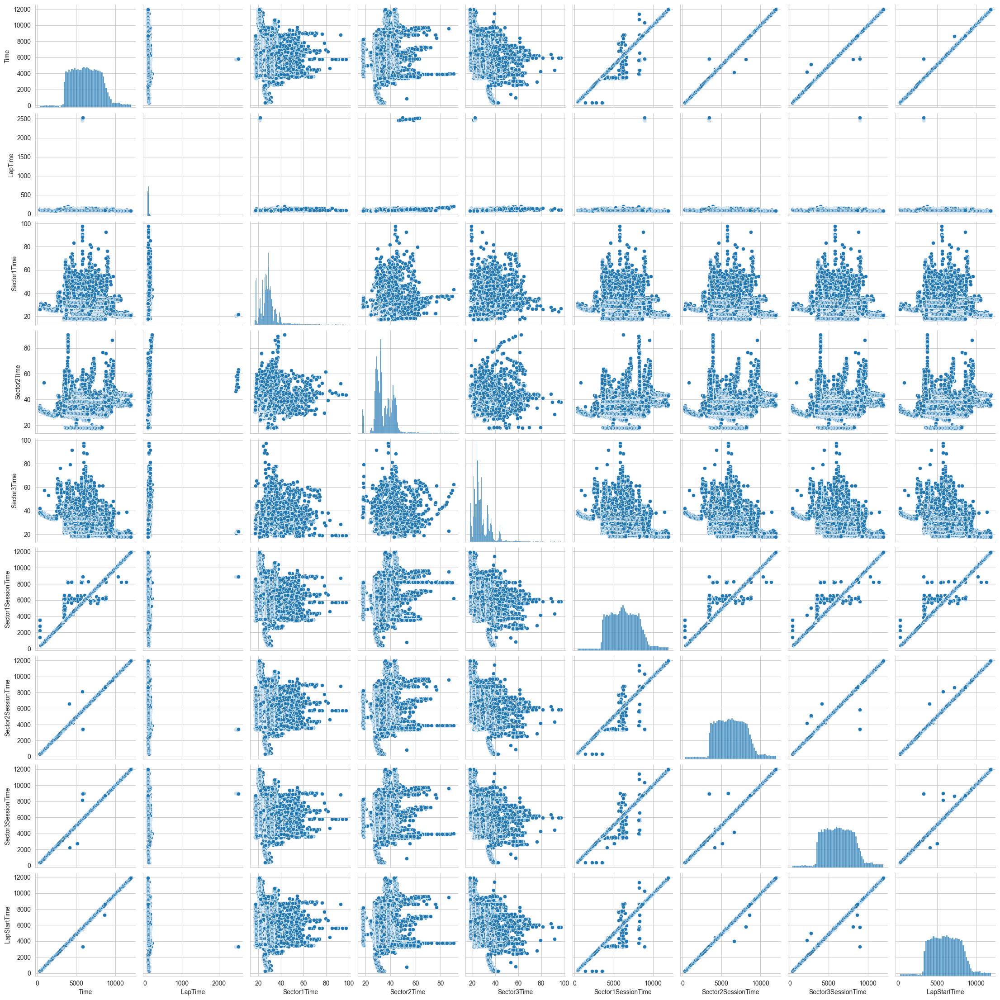

In [22]:
# Displaying the summary statistics of the selected time columns
print(df[['Time', 'LapTime', 'Sector1Time', 'Sector2Time', 'Sector3Time',
          'Sector1SessionTime', 'Sector2SessionTime', 'Sector3SessionTime', 'LapStartTime']].describe())

# Creating a pairplot for the time columns
sns.pairplot(df[['Time', 'LapTime', 'Sector1Time', 'Sector2Time', 'Sector3Time',
                 'Sector1SessionTime', 'Sector2SessionTime', 'Sector3SessionTime', 'LapStartTime']])

# Displaying the plot
plt.show()

            SpeedI1       SpeedI2       SpeedFL       SpeedST
count  27045.000000  27045.000000  27045.000000  27045.000000
mean     254.327502    250.162394    270.127311    296.652854
std       42.293211     43.001840     33.201041     30.627822
min       59.000000     57.000000      1.000000     64.000000
25%      215.000000    222.000000    250.000000    289.000000
50%      271.000000    260.000000    276.000000    302.000000
75%      287.000000    280.000000    290.000000    312.000000
max      340.000000    343.000000    357.000000    362.000000


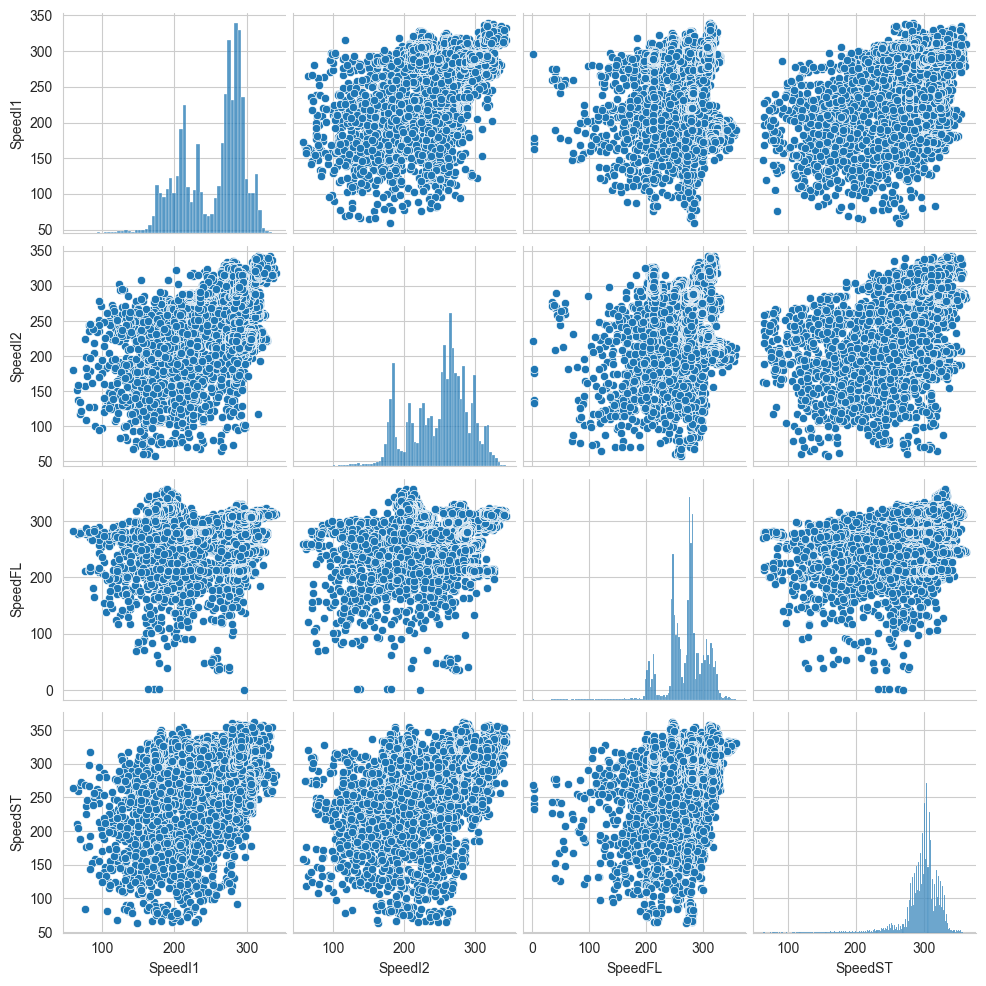

In [23]:
# Displaying the summary statistics of the selected speed columns
print(df[['SpeedI1', 'SpeedI2', 'SpeedFL', 'SpeedST']].describe())

# Creating a pairplot for the speed columns
sns.pairplot(df[['SpeedI1', 'SpeedI2', 'SpeedFL', 'SpeedST']])

# Displaying the plot
plt.show()

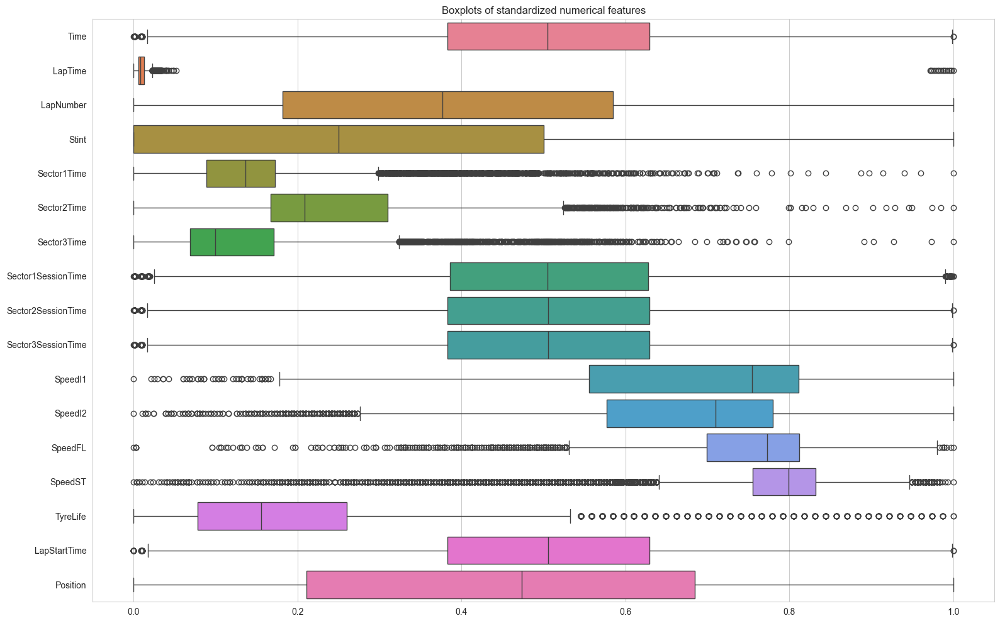

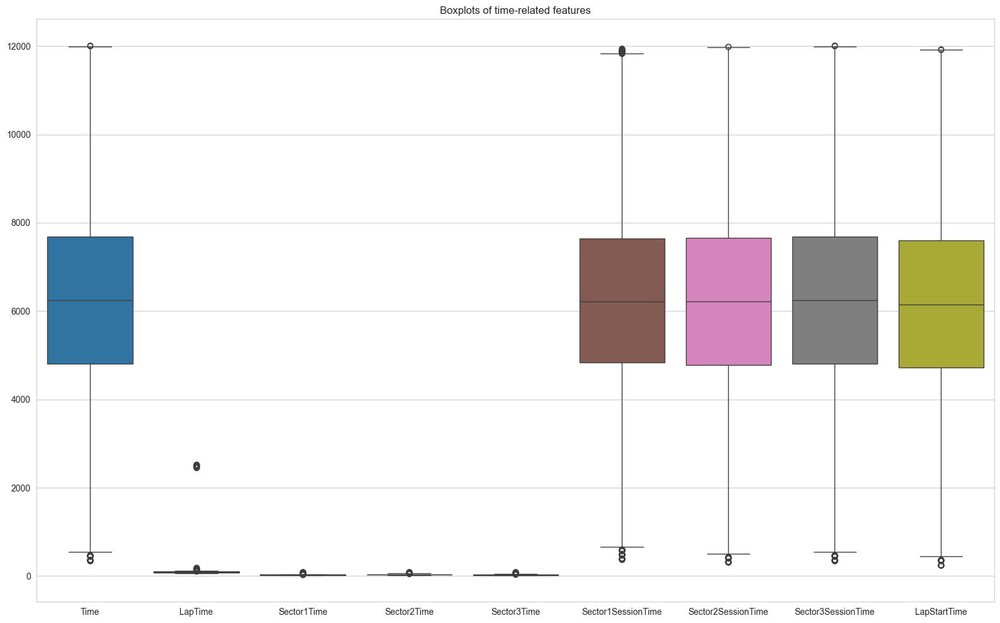

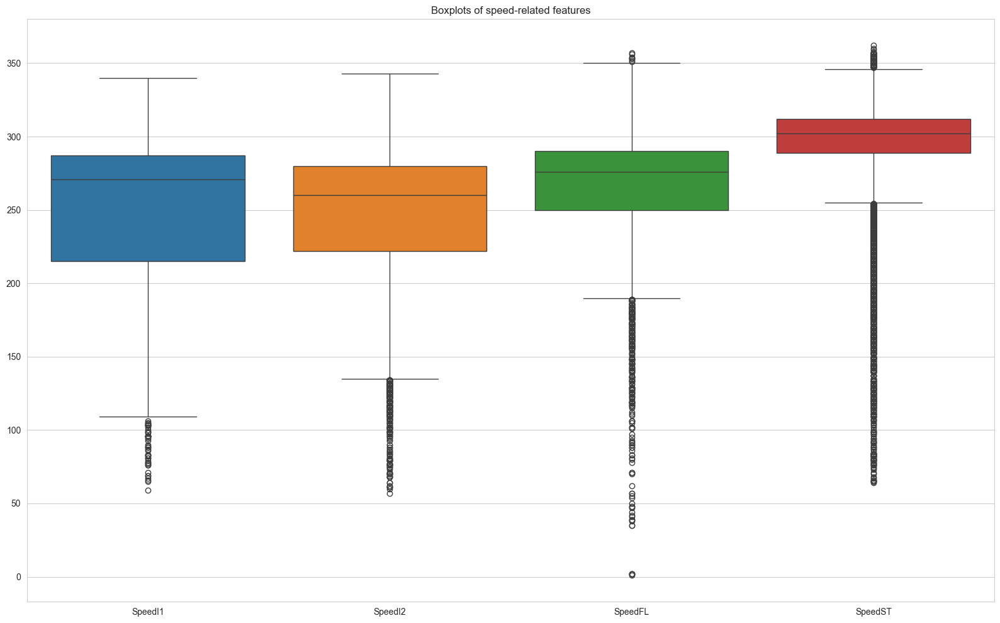

In [24]:
# List of columns to plot
cols_to_plot = [
    'Time', 'LapTime', 'LapNumber', 'Stint', 'Sector1Time', 'Sector2Time', 'Sector3Time',
    'Sector1SessionTime', 'Sector2SessionTime', 'Sector3SessionTime', 'SpeedI1', 'SpeedI2',
    'SpeedFL', 'SpeedST', 'TyreLife', 'LapStartTime', 'Position'
]

# Initialize MinMaxScaler to scale between 0 and 1
scaler = MinMaxScaler()

# Apply standardization to the selected columns
df_scaled = df[cols_to_plot].copy()
df_scaled[cols_to_plot] = scaler.fit_transform(df_scaled[cols_to_plot])

# Plot the boxplots after normalization
plt.figure(figsize=(16, 10))
sns.boxplot(data=df_scaled, orient='h')
plt.title("Boxplots of standardized numerical features")
plt.tight_layout()
plt.show()

# Separating columns based on their scale
time_columns = [
    'Time', 'LapTime', 'Sector1Time', 'Sector2Time', 'Sector3Time',
    'Sector1SessionTime', 'Sector2SessionTime', 'Sector3SessionTime',
    'LapStartTime'
]
speed_columns = ['SpeedI1', 'SpeedI2', 'SpeedFL', 'SpeedST']

# Plot boxplots for time-related columns
plt.figure(figsize=(16, 10))
sns.boxplot(data=df[time_columns])
plt.title("Boxplots of time-related features")
plt.tight_layout()
plt.show()

# Plot boxplots for speed-related columns
plt.figure(figsize=(16, 10))
sns.boxplot(data=df[speed_columns])
plt.title("Boxplots of speed-related features")
plt.tight_layout()
plt.show()

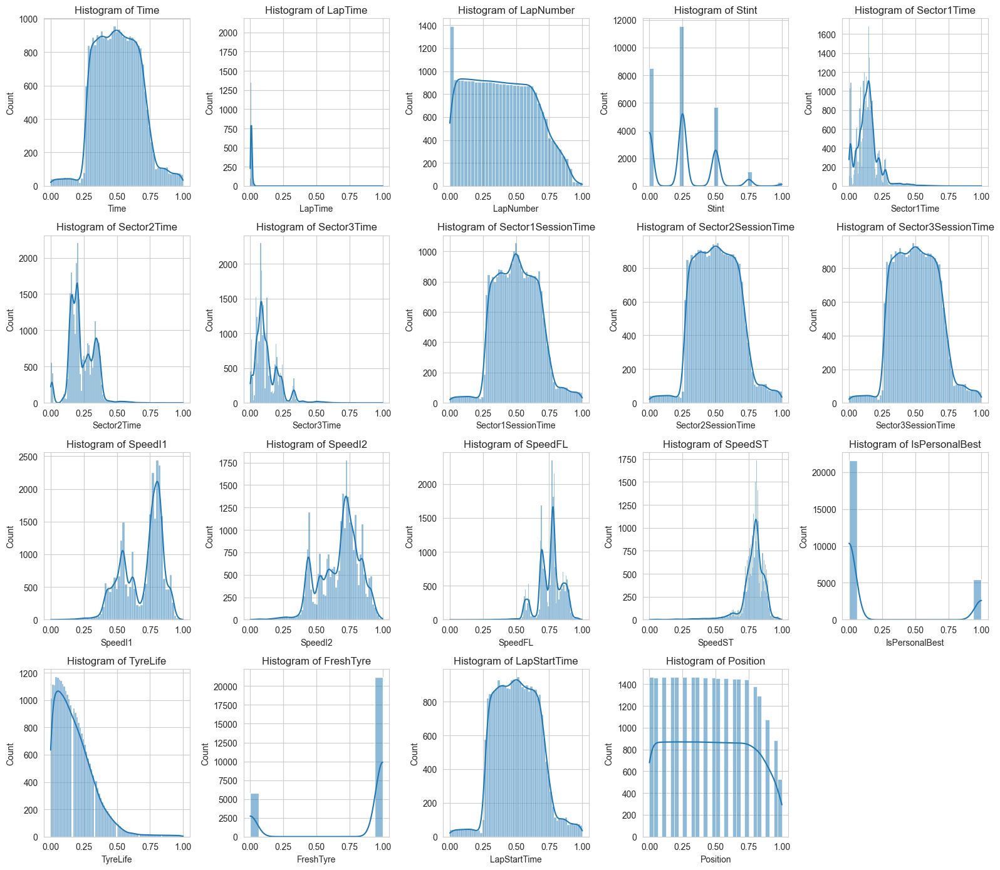

In [25]:
# List of numerical columns to scale and plot histograms
cols_to_scale = [
    'Time', 'LapTime', 'LapNumber', 'Stint', 'Sector1Time', 'Sector2Time', 'Sector3Time',
    'Sector1SessionTime', 'Sector2SessionTime', 'Sector3SessionTime', 'SpeedI1', 'SpeedI2',
    'SpeedFL', 'SpeedST', 'IsPersonalBest', 'TyreLife', 'FreshTyre', 'LapStartTime', 'Position'
]

# Apply MinMaxScaler to the selected columns
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])

# Plotting histograms for each numerical column
plt.figure(figsize=(16, 14))
for i, col in enumerate(cols_to_scale, 1):
    plt.subplot(4, 5, i)  # 4 rows and 5 columns of subplots
    sns.histplot(df[col], kde=True)  # kde=True adds the kernel density estimate curve
    plt.title(f'Histogram of {col}')
    plt.tight_layout()

plt.show()

In [26]:
# Calculate skewness of numerical columns
skewness_values = df[cols_to_scale].skew()

# Display the results
print("Skewness of each numeric column:")
print(skewness_values)

Skewness of each numeric column:
Time                   0.150804
LapTime               38.370936
LapNumber              0.187950
Stint                  0.679263
Sector1Time            1.736299
Sector2Time            0.574581
Sector3Time            1.882941
Sector1SessionTime     0.150257
Sector2SessionTime     0.150797
Sector3SessionTime     0.148297
SpeedI1               -0.674867
SpeedI2               -0.600092
SpeedFL               -0.978226
SpeedST               -2.933626
IsPersonalBest         1.489722
TyreLife               1.433968
FreshTyre             -1.380536
LapStartTime           0.151130
Position               0.061868
dtype: float64


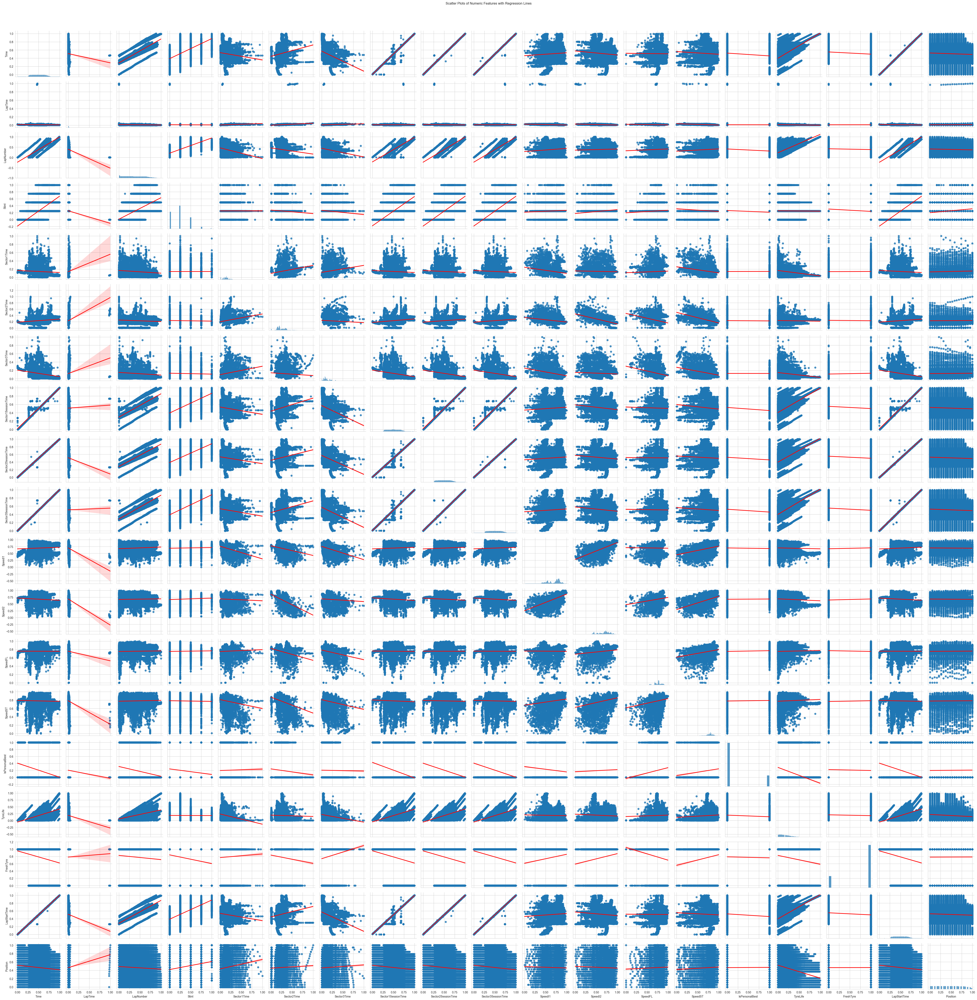

In [27]:
# Plotting scatter plots with regression line for each pair of numerical columns
sns.pairplot(df[cols_to_scale], height=2.5, kind='reg', plot_kws={'line_kws': {'color': 'red'}})

# Adding a title
plt.suptitle("Scatter Plots of Numeric Features with Regression Lines", y=1.02)

# Adjusting the layout
plt.tight_layout()
plt.show()

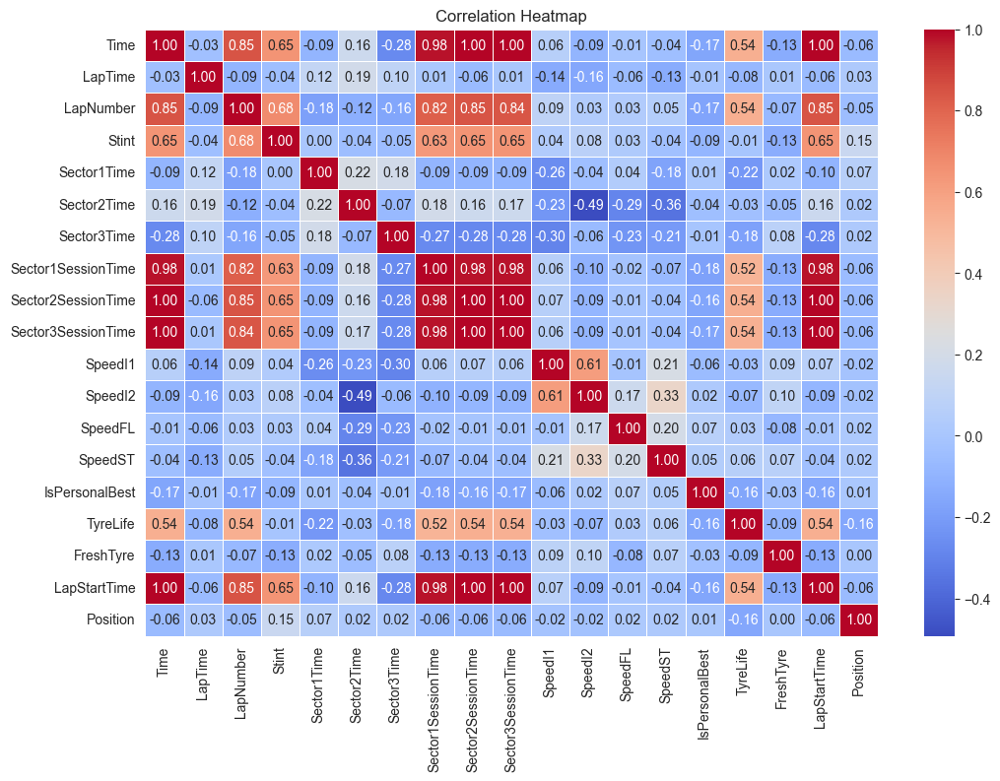

In [28]:
# Calculate correlation only for numeric columns
corr = df.select_dtypes(include=['float64', 'int64']).corr()

# Plotting the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

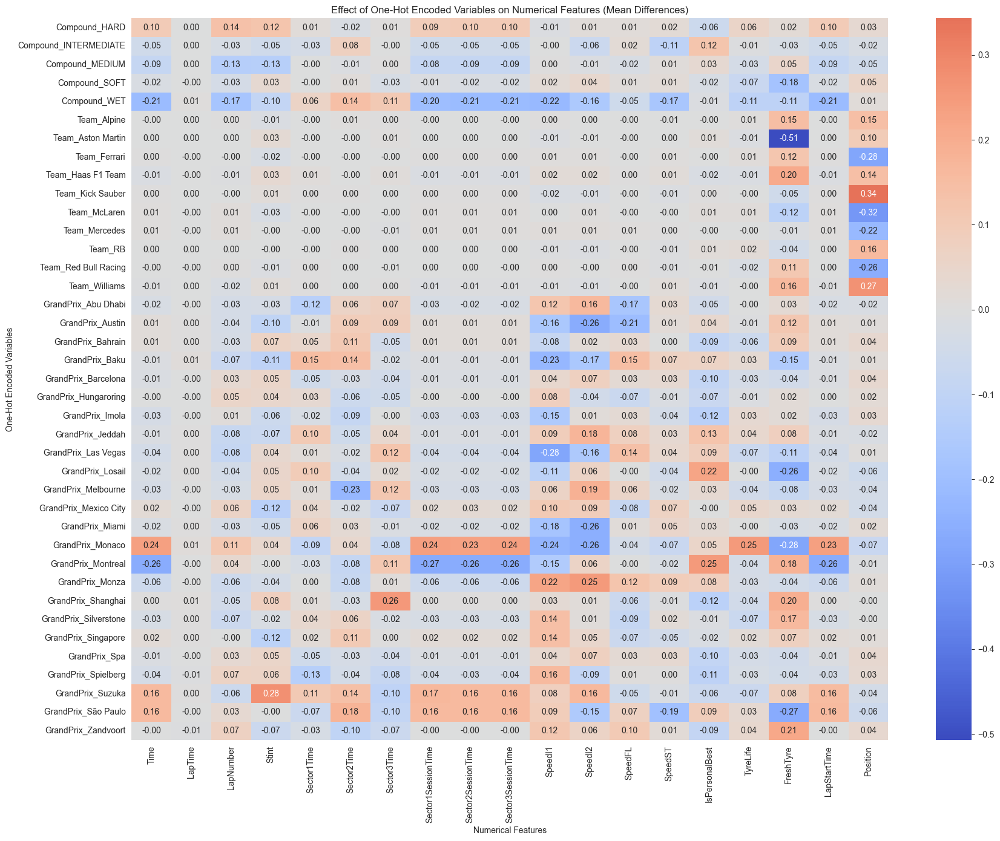

In [29]:
one_hot_cols = df.select_dtypes(include='bool').columns   # GrandPrix_, Team_, Compound_
num_cols = df.select_dtypes(include='float64').columns    # All numeric columns

# Compute mean differences
mean_diff_dict = {}

for col in one_hot_cols:
    mean_if_1 = df[df[col] == 1][num_cols].mean()  # Mean of numerical features where this OHE col is active
    mean_if_0 = df[df[col] == 0][num_cols].mean()  # Mean where it's not active
    diff = mean_if_1 - mean_if_0                  # Difference in means
    mean_diff_dict[col] = diff

# Create DataFrame
mean_diff_df = pd.DataFrame(mean_diff_dict).T.round(3)  # Round for readability

# Plot heatmap with values
plt.figure(figsize=(18, 14))
sns.heatmap(mean_diff_df, cmap='coolwarm', center=0, annot=True, fmt=".2f")
plt.title("Effect of One-Hot Encoded Variables on Numerical Features (Mean Differences)")
plt.xlabel("Numerical Features")
plt.ylabel("One-Hot Encoded Variables")
plt.tight_layout()
plt.show()

In [30]:
# Data types of columns
print(df.dtypes)

Time                     float64
LapTime                  float64
LapNumber                float64
Stint                    float64
Sector1Time              float64
Sector2Time              float64
Sector3Time              float64
Sector1SessionTime       float64
Sector2SessionTime       float64
Sector3SessionTime       float64
SpeedI1                  float64
SpeedI2                  float64
SpeedFL                  float64
SpeedST                  float64
IsPersonalBest           float64
TyreLife                 float64
FreshTyre                float64
LapStartTime             float64
Position                 float64
Compound_HARD               bool
Compound_INTERMEDIATE       bool
Compound_MEDIUM             bool
Compound_SOFT               bool
Compound_WET                bool
Team_Alpine                 bool
Team_Aston Martin           bool
Team_Ferrari                bool
Team_Haas F1 Team           bool
Team_Kick Sauber            bool
Team_McLaren                bool
Team_Merce

In [31]:
# Verify the result
print(df.isnull().sum())

Time                     0
LapTime                  0
LapNumber                0
Stint                    0
Sector1Time              0
Sector2Time              0
Sector3Time              0
Sector1SessionTime       0
Sector2SessionTime       0
Sector3SessionTime       0
SpeedI1                  0
SpeedI2                  0
SpeedFL                  0
SpeedST                  0
IsPersonalBest           0
TyreLife                 0
FreshTyre                0
LapStartTime             0
Position                 0
Compound_HARD            0
Compound_INTERMEDIATE    0
Compound_MEDIUM          0
Compound_SOFT            0
Compound_WET             0
Team_Alpine              0
Team_Aston Martin        0
Team_Ferrari             0
Team_Haas F1 Team        0
Team_Kick Sauber         0
Team_McLaren             0
Team_Mercedes            0
Team_RB                  0
Team_Red Bull Racing     0
Team_Williams            0
GrandPrix_Abu Dhabi      0
GrandPrix_Austin         0
GrandPrix_Bahrain        0
G

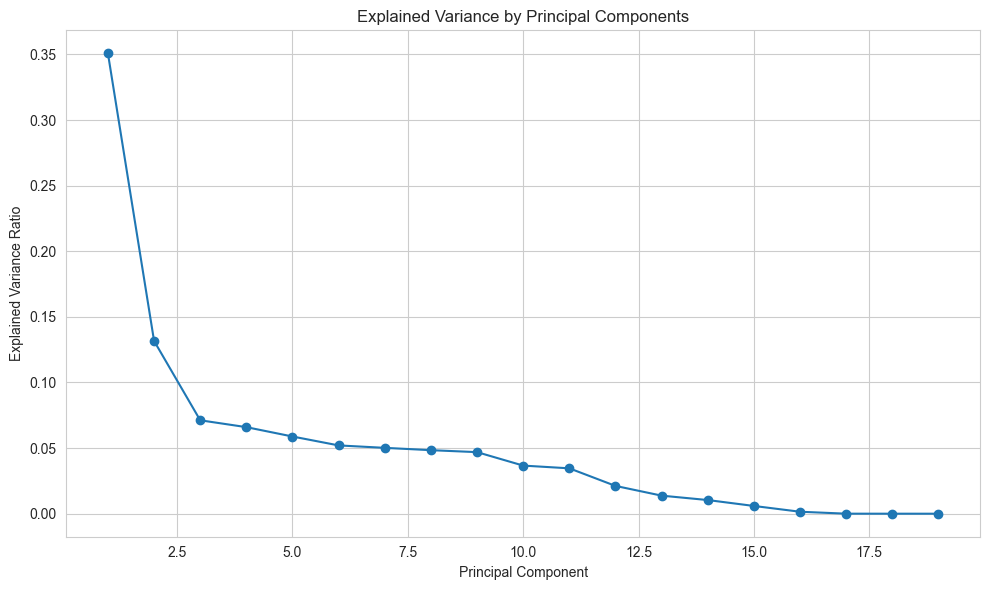

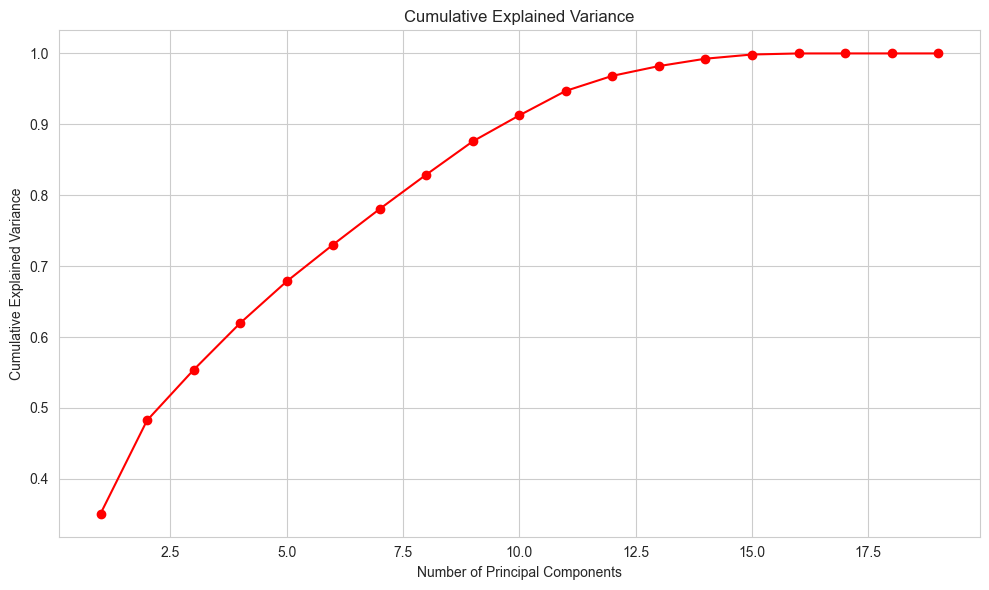

In [32]:
# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[cols_to_scale])

# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(scaled_data)

# Convert PCA result to DataFrame
pca_df = pd.DataFrame(pca_result, columns=[f'PC{i+1}' for i in range(pca_result.shape[1])])

# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.grid(True)
plt.tight_layout()
plt.show()

# Cumulative explained variance (optional)
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1),
         pca.explained_variance_ratio_.cumsum(), marker='o', color='red')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance')
plt.grid(True)
plt.tight_layout()
plt.show()

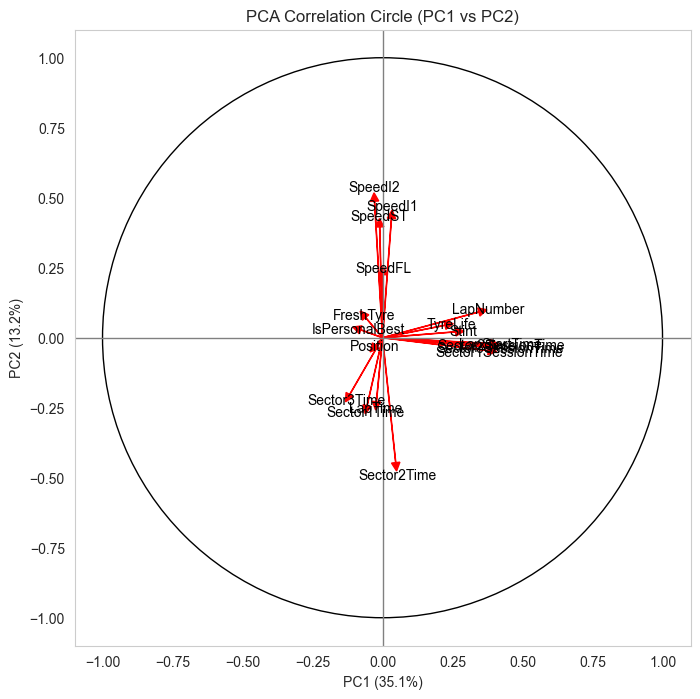

In [33]:
# Plot correlation circle
plt.figure(figsize=(8, 8))
plt.axhline(0, color='grey', lw=1)
plt.axvline(0, color='grey', lw=1)
circle = plt.Circle((0, 0), 1, color='black', fill=False)
plt.gca().add_artist(circle)

for i, var in enumerate(cols_to_scale):
    plt.arrow(0, 0,
              pca.components_[0, i],
              pca.components_[1, i],
              head_width=0.03, head_length=0.03, fc='red', ec='red')
    plt.text(pca.components_[0, i]*1.1,
             pca.components_[1, i]*1.1,
             var, color='black', ha='center', va='center')

plt.title('PCA Correlation Circle (PC1 vs PC2)')
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
plt.xlim(-1.1, 1.1)
plt.ylim(-1.1, 1.1)
plt.grid()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

In [34]:
# Feature selection based on correlations with LapTime
features = [
    'SpeedI1', 'SpeedI2', 'SpeedFL', 'SpeedST',
    'LapNumber', 'TyreLife',
    'LapStartTime', 'Stint', 'Position'
]

target = 'LapTime'

X = df[features]
y = df[target]

# First split: 80% train+val, 20% test
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Second split: 75% train, 25% validation (from train_val)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=0.25, random_state=42
)  # This gives 60% train, 20% val, 20% test

In [35]:
print(df[features + ['LapTime']].corr()['LapTime'].sort_values())

SpeedI2        -0.155171
SpeedI1        -0.137032
SpeedST        -0.133385
LapNumber      -0.093601
TyreLife       -0.077547
LapStartTime   -0.064261
SpeedFL        -0.060182
Stint          -0.040213
Position        0.026323
LapTime         1.000000
Name: LapTime, dtype: float64


In [36]:
# Models to evaluate
models = {
    'Linear Regression': LinearRegression(),
    'KNN': KNeighborsRegressor(n_neighbors=5),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Bagging (Decision Tree)': BaggingRegressor(
        estimator=DecisionTreeRegressor(random_state=42),
        n_estimators=100,
        random_state=42
    ),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42),
    'XGBoost': xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
}

# Store trained models
trained_models = {}

# Store model performance metrics
model_performance = {}

# Store the best CV score for each model
best_cv_scores = {}

# Loop over each model
for model_name, model in models.items():
    print(f"\nEvaluating {model_name}")

    best_cv_score = float('inf')  # Initialize best CV score to infinity
    best_cv = 3  # Start with 3-fold CV

    # Test different values of cv (from 3 to 10)
    for cv_value in range(3, 11):
        print(f"Evaluating with CV = {cv_value}")

        # Cross-validation on training set
        cv_scores = cross_val_score(model, X_train, y_train, cv=cv_value, scoring='neg_mean_squared_error')
        rmse_scores = np.sqrt(-cv_scores)
        mean_rmse = rmse_scores.mean()

        print(f"Cross-validated RMSE scores (train) for CV={cv_value}: {rmse_scores}")
        print(f"Mean RMSE (train) for CV={cv_value}: {mean_rmse}")

        # If the current cv_value gives a better (lower) mean RMSE, update the best_cv_score and best_cv
        if mean_rmse < best_cv_score:
            best_cv_score = mean_rmse
            best_cv = cv_value

    # Store the best CV for this model
    best_cv_scores[model_name] = best_cv

    print(f"Best CV for {model_name} is {best_cv} with RMSE: {best_cv_score}")

    # Train the model on the full training data using the best CV value
    model.fit(X_train, y_train)
    trained_models[model_name] = model

    # Evaluate on validation set
    y_val_pred = model.predict(X_val)
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    val_r2 = r2_score(y_val, y_val_pred)
    print(f"Validation RMSE for {model_name}: {val_rmse}")
    print(f"Validation R² for {model_name}: {val_r2}")

    # Evaluate on test set
    y_test_pred = model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    test_r2 = r2_score(y_test, y_test_pred)
    print(f"Test RMSE for {model_name}: {test_rmse}")
    print(f"Test R² for {model_name}: {test_r2}")

    # Store performance in the dictionary
    model_performance[model_name] = {
        'Val RMSE': val_rmse,
        'Val R²': val_r2,
        'Test RMSE': test_rmse,
        'Test R²': test_r2
    }

# Sort models based on Test RMSE (ascending order)
sorted_models = sorted(model_performance.items(), key=lambda x: x[1]['Test RMSE'])

# Print the ranking
print("\nModel Ranking based on Test RMSE:")
for rank, (model_name, performance) in enumerate(sorted_models, start=1):
    print(f"{rank}. {model_name} - Test RMSE: {performance['Test RMSE']:.5f}, Test R²: {performance['Test R²']:.5f}")


Evaluating Linear Regression
Evaluating with CV = 3
Cross-validated RMSE scores (train) for CV=3: [0.02654425 0.02299321 0.02642649]
Mean RMSE (train) for CV=3: 0.025321317573029856
Evaluating with CV = 4
Cross-validated RMSE scores (train) for CV=4: [0.03051825 0.01598363 0.02633823 0.02641256]
Mean RMSE (train) for CV=4: 0.024813167987042088
Evaluating with CV = 5
Cross-validated RMSE scores (train) for CV=5: [0.03405004 0.01758353 0.02407966 0.02945626 0.01754773]
Mean RMSE (train) for CV=5: 0.024543443969464628
Evaluating with CV = 6
Cross-validated RMSE scores (train) for CV=6: [0.03724114 0.00557319 0.01912392 0.02625749 0.03219568 0.01906478]
Mean RMSE (train) for CV=6: 0.02324269859571738
Evaluating with CV = 7
Cross-validated RMSE scores (train) for CV=7: [0.03503526 0.02014138 0.02050987 0.02036659 0.02033001 0.03472703
 0.02046175]
Mean RMSE (train) for CV=7: 0.024510271094931074
Evaluating with CV = 8
Cross-validated RMSE scores (train) for CV=8: [0.03741618 0.02142725 0.0

In [37]:
# Models with hyperparameter grids
models_params = {
    'Ridge Regression': {
        'model': Ridge(),
        'params': {'alpha': [0.01, 0.1, 1, 10, 100]}
    },
    'Lasso Regression': {
        'model': Lasso(max_iter=10000),
        'params': {'alpha': [0.001, 0.01, 0.1, 1, 10]}
    },
    'ElasticNet': {
        'model': ElasticNet(max_iter=10000),
        'params': {
            'alpha': [0.01, 0.1, 1.0],
            'l1_ratio': [0.1, 0.5, 0.9]
        }
    },
    'KNN': {
        'model': KNeighborsRegressor(),
        'params': {'n_neighbors': [5, 7, 9], 'weights': ['uniform', 'distance']}
    },
    'Decision Tree': {
        'model': DecisionTreeRegressor(random_state=42),
        'params': {'max_depth': [None, 5, 10, 20], 'min_samples_split': [2, 5, 10]}
    },
    'Bagging (Decision Tree)': {
        'model': BaggingRegressor(
            estimator=DecisionTreeRegressor(random_state=42),
            random_state=42),
        'params': {'n_estimators': [50, 100, 200], 'max_samples': [0.5, 1.0]}
    },
    'Random Forest': {
        'model': RandomForestRegressor(random_state=42),
        'params': {'n_estimators': [50, 100, 200],
                   'max_depth': [None, 5, 10],
                   'min_samples_split': [2, 5]}
    },
    'Gradient Boosting': {
        'model': GradientBoostingRegressor(random_state=42),
        'params': {'n_estimators': [100, 200],
                   'learning_rate': [0.01, 0.1],
                   'max_depth': [3, 5]}
    },
    'XGBoost': {
        'model': xgb.XGBRegressor(random_state=42, verbosity=0),
        'params': {'n_estimators': [100, 200],
                   'learning_rate': [0.01, 0.1],
                   'max_depth': [3, 5]}
    }
}

trained_models = {}
model_performance = {}

for model_name, mp in models_params.items():
    print(f"\nOptimizing {model_name}...")

    grid_search = GridSearchCV(mp['model'], mp['params'],
                               cv=7, scoring='neg_mean_squared_error', n_jobs=-1) # With cv=7
    grid_search.fit(X_train, y_train)

    results = grid_search.cv_results_
    for mean_score, params in zip(results['mean_test_score'], results['params']):
        print(f"Score (neg MSE): {mean_score:.5f}, params: {params}")

    best_model = grid_search.best_estimator_
    print(f"Best params for {model_name}: {grid_search.best_params_}")

    # Final training on full training set with best model
    best_model.fit(X_train, y_train)
    trained_models[model_name] = best_model

    # Validation evaluation
    y_val_pred = best_model.predict(X_val)
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    val_r2 = r2_score(y_val, y_val_pred)
    print(f"Validation RMSE: {val_rmse:.5f}, R²: {val_r2:.5f}")

    # Test evaluation
    y_test_pred = best_model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    test_r2 = r2_score(y_test, y_test_pred)
    print(f"Test RMSE: {test_rmse:.5f}, R²: {test_r2:.5f}")

    model_performance[model_name] = {
        'Val RMSE': val_rmse,
        'Val R²': val_r2,
        'Test RMSE': test_rmse,
        'Test R²': test_r2
    }

# Sort models by Test RMSE (ascending)
sorted_models = sorted(model_performance.items(), key=lambda x: x[1]['Test RMSE'])

print("\nModel Ranking based on Test RMSE:")
for rank, (model_name, perf) in enumerate(sorted_models, start=1):
    print(f"{rank}. {model_name} - Test RMSE: {perf['Test RMSE']:.5f}, Test R²: {perf['Test R²']:.5f}")


Optimizing Ridge Regression...
Score (neg MSE): -0.00064, params: {'alpha': 0.01}
Score (neg MSE): -0.00064, params: {'alpha': 0.1}
Score (neg MSE): -0.00064, params: {'alpha': 1}
Score (neg MSE): -0.00064, params: {'alpha': 10}
Score (neg MSE): -0.00064, params: {'alpha': 100}
Best params for Ridge Regression: {'alpha': 10}
Validation RMSE: 0.02952, R²: 0.04587
Test RMSE: 0.00516, R²: -0.00942

Optimizing Lasso Regression...
Score (neg MSE): -0.00067, params: {'alpha': 0.001}
Score (neg MSE): -0.00067, params: {'alpha': 0.01}
Score (neg MSE): -0.00067, params: {'alpha': 0.1}
Score (neg MSE): -0.00067, params: {'alpha': 1}
Score (neg MSE): -0.00067, params: {'alpha': 10}
Best params for Lasso Regression: {'alpha': 0.001}
Validation RMSE: 0.03022, R²: -0.00012
Test RMSE: 0.00519, R²: -0.01981

Optimizing ElasticNet...
Score (neg MSE): -0.00067, params: {'alpha': 0.01, 'l1_ratio': 0.1}
Score (neg MSE): -0.00067, params: {'alpha': 0.01, 'l1_ratio': 0.5}
Score (neg MSE): -0.00067, params:

In [38]:
# Models with hyperparameter grids
models_params = {
    'Linear Regression': {
        'model': LinearRegression(),
        'params': {}  # No hyperparameters to tune really (different alpha values don't change anything)
    },
    'KNN': {
        'model': KNeighborsRegressor(),
        'params': {
            'n_neighbors': [5, 7, 9],
            'weights': ['uniform', 'distance']
        }
    },
    'Decision Tree': {
        'model': DecisionTreeRegressor(random_state=42),
        'params': {
            'max_depth': [None, 5, 10, 20],
            'min_samples_split': [2, 5, 10]
        }
    },
    'Bagging (Decision Tree)': {
        'model': BaggingRegressor(
            estimator=DecisionTreeRegressor(random_state=42),
            random_state=42
        ),
        'params': {
            'n_estimators': [50, 100, 200],
            'max_samples': [0.5, 1.0]
        }
    },
    'Random Forest': {
        'model': RandomForestRegressor(random_state=42),
        'params': {
            'n_estimators': [100, 200],
            'max_depth': [None, 10, 20],
            'min_samples_split': [2, 5]
        }
    },
    'Gradient Boosting': {
        'model': GradientBoostingRegressor(random_state=42),
        'params': {
            'n_estimators': [100, 200],
            'learning_rate': [0.05, 0.1, 0.2],
            'max_depth': [3, 5]
        }
    },
    'XGBoost': {
        'model': xgb.XGBRegressor(random_state=42, objective='reg:squarederror'),
        'params': {
            'n_estimators': [100, 200],
            'learning_rate': [0.05, 0.1, 0.2],
            'max_depth': [3, 5]
        }
    }
}

cv_values = [3, 5, 7, 10]

trained_models = {}
model_performance = {}
best_cv_scores = {}

for model_name, mp in models_params.items():
    print(f"\n===== {model_name} =====")

    best_cv_score = float('inf')
    best_model = None
    best_cv = None
    best_params = None

    for cv in cv_values:
        print(f"  -> Running GridSearchCV with cv={cv}")

        grid_search = GridSearchCV(
            mp['model'],
            mp['params'],
            cv=cv,
            scoring='neg_mean_squared_error',
            n_jobs=-1,
            verbose=0
        )
        grid_search.fit(X_train, y_train)

        mean_rmse = np.sqrt(-grid_search.best_score_)
        print(f"     Best RMSE (CV={cv}): {mean_rmse:.5f} with params {grid_search.best_params_}")

        if mean_rmse < best_cv_score:
            best_cv_score = mean_rmse
            best_model = grid_search.best_estimator_
            best_cv = cv
            best_params = grid_search.best_params_

    print(f"\nBest CV for {model_name}: {best_cv} with RMSE: {best_cv_score:.5f}")
    print(f"Best params: {best_params}")

    # Save best CV
    best_cv_scores[model_name] = best_cv

    # Train best model on full training data
    best_model.fit(X_train, y_train)
    trained_models[model_name] = best_model

    # Validation set evaluation
    y_val_pred = best_model.predict(X_val)
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    val_r2 = r2_score(y_val, y_val_pred)
    print(f"Validation RMSE: {val_rmse:.5f}, R²: {val_r2:.5f}")

    # Test set evaluation
    y_test_pred = best_model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    test_r2 = r2_score(y_test, y_test_pred)
    print(f"Test RMSE: {test_rmse:.5f}, R²: {test_r2:.5f}")

    model_performance[model_name] = {
        'Best CV': best_cv,
        'Val RMSE': val_rmse,
        'Val R²': val_r2,
        'Test RMSE': test_rmse,
        'Test R²': test_r2
    }

# Sort models by Test RMSE ascending
sorted_models = sorted(model_performance.items(), key=lambda x: x[1]['Test RMSE'])

print("\n=== Final model ranking by Test RMSE ===")
for rank, (model_name, perf) in enumerate(sorted_models, 1):
    print(f"{rank}. {model_name} - Test RMSE: {perf['Test RMSE']:.5f}, Test R²: {perf['Test R²']:.5f}, Best CV: {perf['Best CV']}")


===== Linear Regression =====
  -> Running GridSearchCV with cv=3
     Best RMSE (CV=3): 0.02537 with params {}
  -> Running GridSearchCV with cv=5
     Best RMSE (CV=5): 0.02539 with params {}
  -> Running GridSearchCV with cv=7
     Best RMSE (CV=7): 0.02537 with params {}
  -> Running GridSearchCV with cv=10
     Best RMSE (CV=10): 0.02539 with params {}

Best CV for Linear Regression: 7 with RMSE: 0.02537
Best params: {}
Validation RMSE: 0.02951, R²: 0.04620
Test RMSE: 0.00520, R²: -0.02531

===== KNN =====
  -> Running GridSearchCV with cv=3
     Best RMSE (CV=3): 0.01479 with params {'n_neighbors': 5, 'weights': 'distance'}
  -> Running GridSearchCV with cv=5
     Best RMSE (CV=5): 0.01403 with params {'n_neighbors': 5, 'weights': 'distance'}
  -> Running GridSearchCV with cv=7
     Best RMSE (CV=7): 0.01320 with params {'n_neighbors': 5, 'weights': 'distance'}
  -> Running GridSearchCV with cv=10
     Best RMSE (CV=10): 0.01352 with params {'n_neighbors': 5, 'weights': 'distanc

In [39]:
# Models with hyperparameter grids
models_params = {
    'Linear Regression': {
        'model': LinearRegression(),
        'params': {}  # No hyperparameters to tune really (different alpha values don't change anything)
    },
    'KNN': {
        'model': KNeighborsRegressor(),
        'params': {
            'n_neighbors': [5, 7, 9],
            'weights': ['uniform', 'distance']
        }
    },
    'Decision Tree': {
        'model': DecisionTreeRegressor(random_state=42),
        'params': {
            'max_depth': [None, 5, 10, 20],
            'min_samples_split': [2, 5, 10]
        }
    },
    'Bagging (Decision Tree)': {
        'model': BaggingRegressor(
            estimator=DecisionTreeRegressor(random_state=42),
            random_state=42
        ),
        'params': {
            'n_estimators': [50, 100, 200],
            'max_samples': [0.5, 1.0]
        }
    },
    'Random Forest': {
        'model': RandomForestRegressor(random_state=42),
        'params': {
            'n_estimators': [100, 200],
            'max_depth': [None, 10, 20],
            'min_samples_split': [2, 5]
        }
    },
    'Gradient Boosting': {
        'model': GradientBoostingRegressor(random_state=42),
        'params': {
            'n_estimators': [100, 200],
            'learning_rate': [0.05, 0.1, 0.2],
            'max_depth': [3, 5]
        }
    },
    'XGBoost': {
        'model': xgb.XGBRegressor(random_state=42, objective='reg:squarederror'),
        'params': {
            'n_estimators': [100, 200],
            'learning_rate': [0.05, 0.1, 0.2],
            'max_depth': [3, 5]
        }
    }
}

cv_values = list(range(3, 11))

trained_models = {}
model_performance = {}
best_cv_scores = {}

for model_name, mp in models_params.items():
    print(f"\n===== {model_name} =====")

    best_cv_score = float('inf')
    best_model = None
    best_cv = None
    best_params = None

    for cv in cv_values:
        print(f"  -> Running GridSearchCV with cv={cv}")

        grid_search = GridSearchCV(
            mp['model'],
            mp['params'],
            cv=cv,
            scoring='neg_mean_squared_error',
            n_jobs=-1,
            verbose=0
        )
        grid_search.fit(X_train, y_train)

        mean_rmse = np.sqrt(-grid_search.best_score_)
        print(f"     Best RMSE (CV={cv}): {mean_rmse:.5f} with params {grid_search.best_params_}")

        if mean_rmse < best_cv_score:
            best_cv_score = mean_rmse
            best_model = grid_search.best_estimator_
            best_cv = cv
            best_params = grid_search.best_params_

    print(f"\nBest CV for {model_name}: {best_cv} with RMSE: {best_cv_score:.5f}")
    print(f"Best params: {best_params}")

    # Save best CV
    best_cv_scores[model_name] = best_cv

    # Train best model on full training data
    best_model.fit(X_train, y_train)
    trained_models[model_name] = best_model

    # Validation set evaluation
    y_val_pred = best_model.predict(X_val)
    val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
    val_r2 = r2_score(y_val, y_val_pred)
    print(f"Validation RMSE: {val_rmse:.5f}, R²: {val_r2:.5f}")

    # Test set evaluation
    y_test_pred = best_model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    test_r2 = r2_score(y_test, y_test_pred)
    print(f"Test RMSE: {test_rmse:.5f}, R²: {test_r2:.5f}")

    model_performance[model_name] = {
        'Best CV': best_cv,
        'Val RMSE': val_rmse,
        'Val R²': val_r2,
        'Test RMSE': test_rmse,
        'Test R²': test_r2
    }

# Sort models by Test RMSE ascending
sorted_models = sorted(model_performance.items(), key=lambda x: x[1]['Test RMSE'])

print("\n=== Final model ranking by Test RMSE ===")
for rank, (model_name, perf) in enumerate(sorted_models, 1):
    print(f"{rank}. {model_name} - Test RMSE: {perf['Test RMSE']:.5f}, Test R²: {perf['Test R²']:.5f}, Best CV: {perf['Best CV']}")


===== Linear Regression =====
  -> Running GridSearchCV with cv=3
     Best RMSE (CV=3): 0.02537 with params {}
  -> Running GridSearchCV with cv=4
     Best RMSE (CV=4): 0.02539 with params {}
  -> Running GridSearchCV with cv=5
     Best RMSE (CV=5): 0.02539 with params {}
  -> Running GridSearchCV with cv=6
     Best RMSE (CV=6): 0.02541 with params {}
  -> Running GridSearchCV with cv=7
     Best RMSE (CV=7): 0.02537 with params {}
  -> Running GridSearchCV with cv=8
     Best RMSE (CV=8): 0.02537 with params {}
  -> Running GridSearchCV with cv=9
     Best RMSE (CV=9): 0.02538 with params {}
  -> Running GridSearchCV with cv=10
     Best RMSE (CV=10): 0.02539 with params {}

Best CV for Linear Regression: 7 with RMSE: 0.02537
Best params: {}
Validation RMSE: 0.02951, R²: 0.04620
Test RMSE: 0.00520, R²: -0.02531

===== KNN =====
  -> Running GridSearchCV with cv=3
     Best RMSE (CV=3): 0.01479 with params {'n_neighbors': 5, 'weights': 'distance'}
  -> Running GridSearchCV with cv

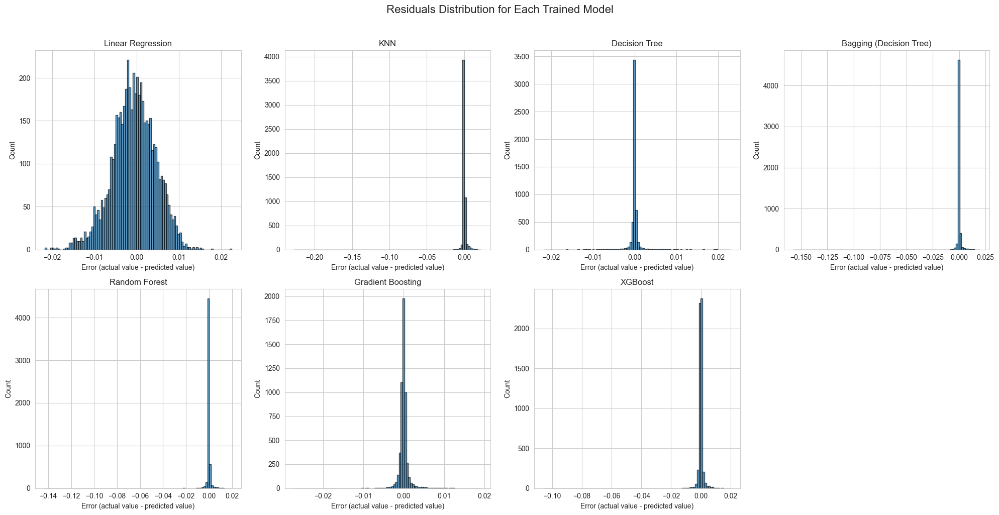

In [40]:
model_names = list(trained_models.keys())
n_models = len(model_names)

n_rows, n_cols = 2, 4

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10))
fig.suptitle("Residuals Distribution for Each Trained Model", fontsize=16, y=1.02)

# Residuals for each trained model with adjusted number of bins
for i, model_name in enumerate(model_names):
    row = i // n_cols
    col = i % n_cols

    ax = axes[row, col]
    model = trained_models[model_name]
    y_pred = model.predict(X_test)
    errors = y_test - y_pred

    ax.hist(errors, bins=100, edgecolor='black', alpha=0.7)
    ax.set_title(f'{model_name}')
    ax.set_xlabel('Error (actual value - predicted value)')
    ax.set_ylabel('Count')
    ax.grid(True)

# Remove empty subplot(s) if any
if n_models < n_rows * n_cols:
    for j in range(n_models, n_rows * n_cols):
        fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

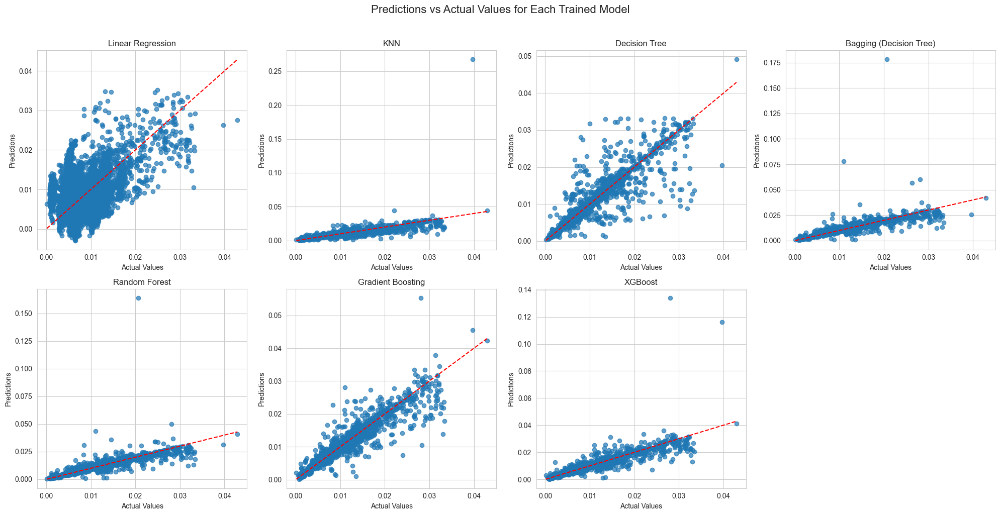

In [41]:
n_rows, n_cols = 2, 4

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10))
fig.suptitle("Predictions vs Actual Values for Each Trained Model", fontsize=16, y=1.02)

# Predictions vs Actual Values
for i, model_name in enumerate(model_names):
    row = i // n_cols
    col = i % n_cols

    ax = axes[row, col]
    model = trained_models[model_name]
    y_pred = model.predict(X_test)

    ax.scatter(y_test, y_pred, alpha=0.7)
    ax.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Reference line
    ax.set_title(f'{model_name}')
    ax.set_xlabel('Actual Values')
    ax.set_ylabel('Predictions')
    ax.grid(True)

# Remove empty subplot(s) if any
if n_models < n_rows * n_cols:
    for j in range(n_models, n_rows * n_cols):
        fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

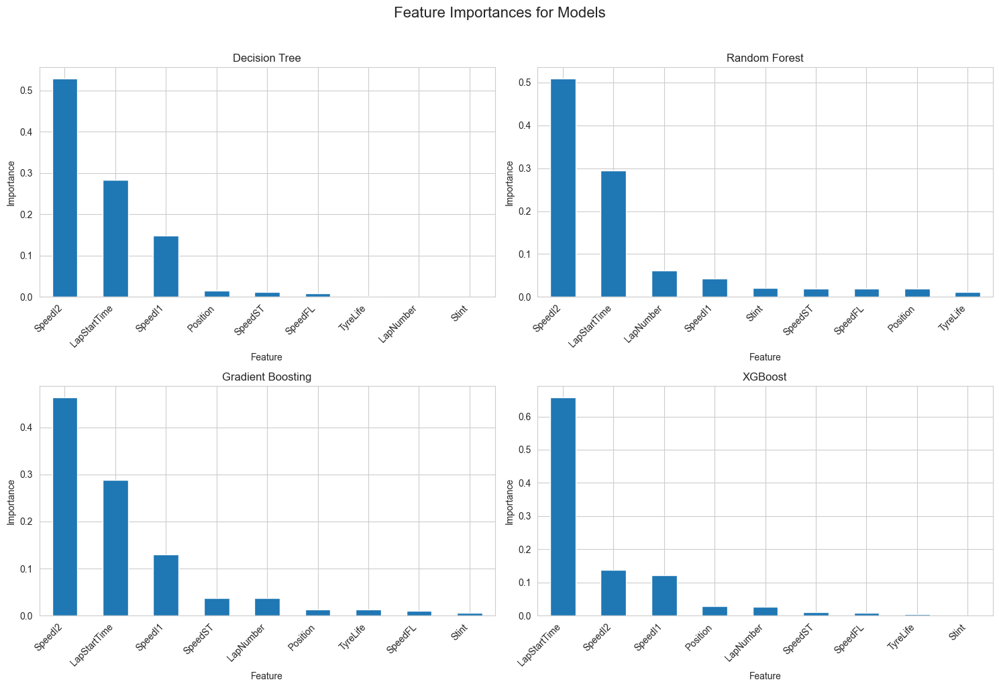

In [42]:
# Filter models that have feature_importances_ attribute
models_with_importance = {name: model for name, model in trained_models.items() if hasattr(model, 'feature_importances_')}

n_models = len(models_with_importance)
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))
fig.suptitle("Feature Importances for Models", fontsize=16, y=1.02)

# Feature Importance for Decision Tree, RandomForest, Gradient Boosting and XGBoost
for i, (model_name, model) in enumerate(models_with_importance.items()):
    row = i // n_cols
    col = i % n_cols

    ax = axes[row, col]
    feature_importances = model.feature_importances_

    # Display features and their importances
    feature_importance_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=False)

    feature_importance_df.plot(kind='bar', x='Feature', y='Importance', legend=False, ax=ax)
    ax.set_title(model_name)
    ax.set_ylabel('Importance')
    ax.set_xticklabels(feature_importance_df['Feature'], rotation=45, ha='right')

# Remove empty subplot(s) if any
if n_models < n_rows * n_cols:
    for j in range(n_models, n_rows * n_cols):
        fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

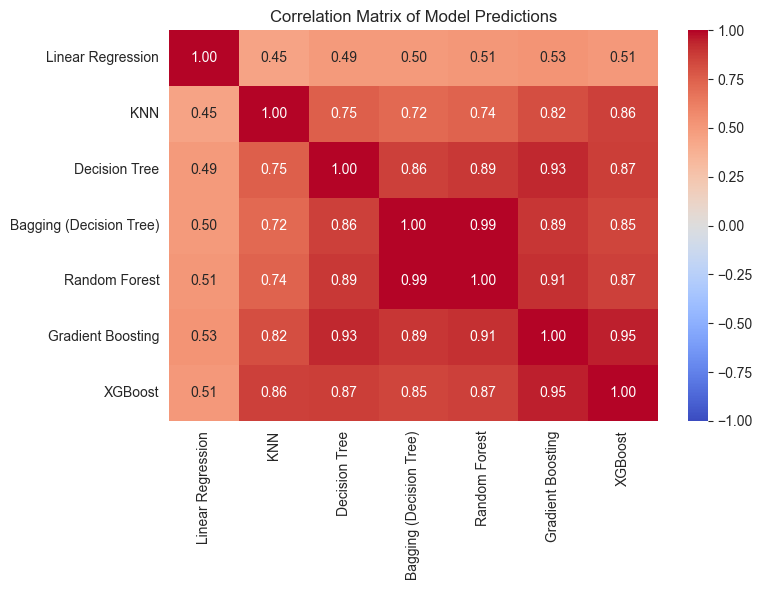

In [43]:
# Correlation matrix between the predictions of different models
predictions = pd.DataFrame({
    model_name: model.predict(X_test)
    for model_name, model in trained_models.items()
})

corr_matrix = predictions.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation Matrix of Model Predictions')
plt.tight_layout()
plt.show()

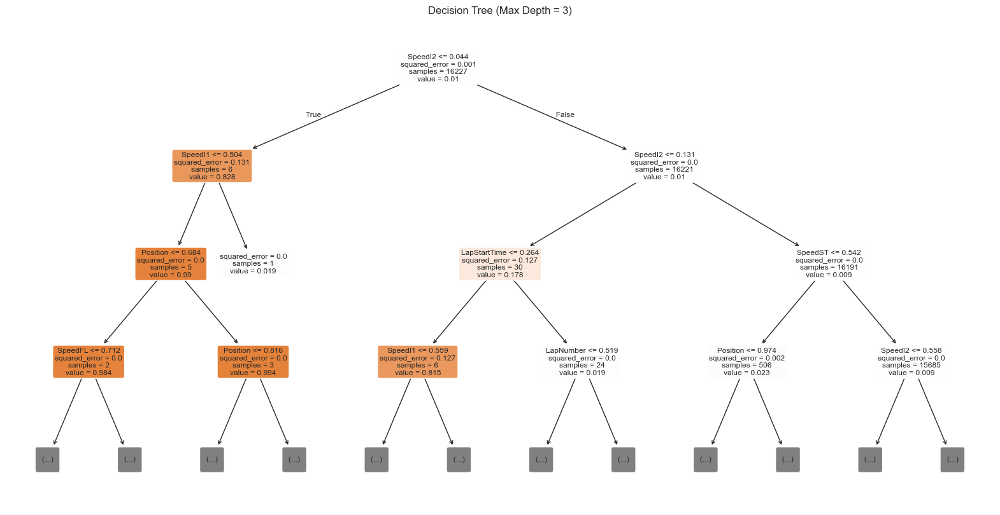

In [44]:
# Visualize Decision Tree (first four levels)
plt.figure(figsize=(20, 10))
plot_tree(models['Decision Tree'], filled=True, feature_names=X_train.columns, rounded=True, max_depth=3)
plt.title("Decision Tree (Max Depth = 3)")
plt.show()

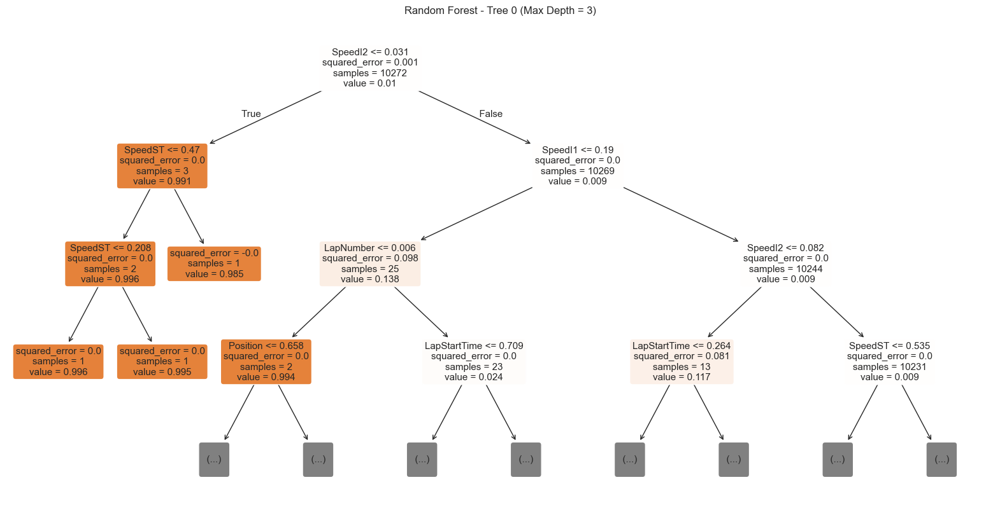

In [45]:
estimator = models['Random Forest'].estimators_[0]  # First tree in the forest (first four levels)

plt.figure(figsize=(20, 10))
plot_tree(estimator, filled=True, feature_names=X_train.columns, rounded=True, max_depth=3)
plt.title("Random Forest - Tree 0 (Max Depth = 3)")
plt.show()


Evaluating Linear Regression
Train RMSE: 0.02533, Train R²: 0.04272
Validation RMSE: 0.02951, Validation R²: 0.04620
Test RMSE: 0.00520, Test R²: -0.02531
Linear Regression - ✅ Reasonable regularization: no strong over/underfitting detected.


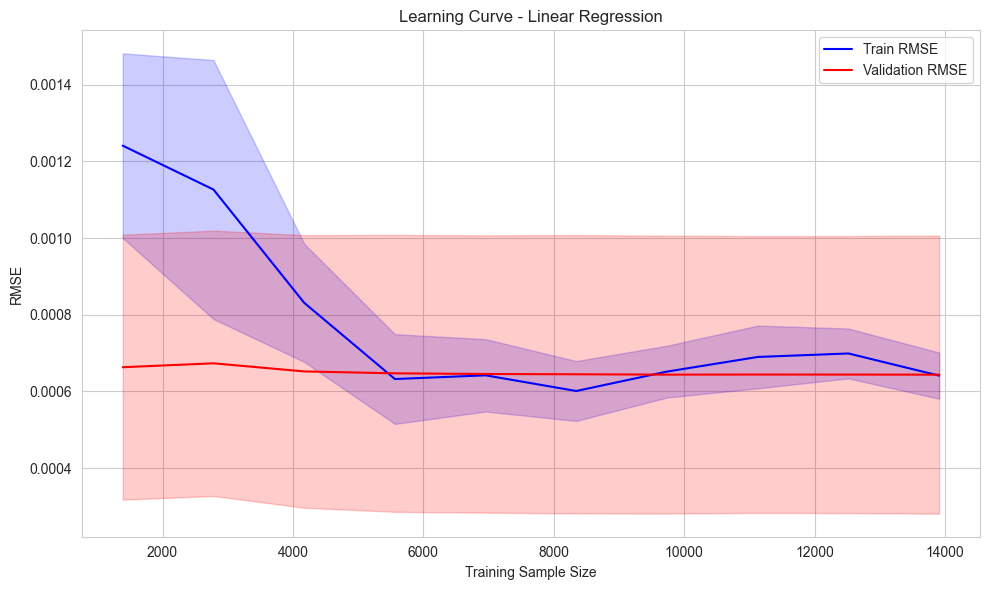


Evaluating KNN
Train RMSE: 0.00000, Train R²: 1.00000
Validation RMSE: 0.00449, Validation R²: 0.97789
Test RMSE: 0.00361, Test R²: 0.50579
KNN - ✅ Proper generalization: low and consistent RMSEs.


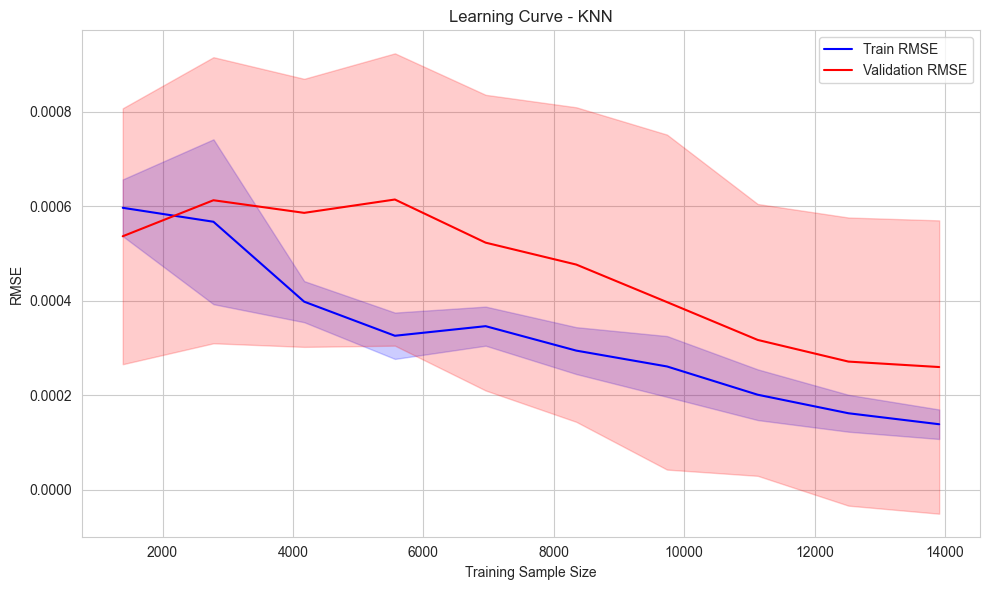


Evaluating Decision Tree
Train RMSE: 0.00000, Train R²: 1.00000
Validation RMSE: 0.01878, Validation R²: 0.61379
Test RMSE: 0.00196, Test R²: 0.85474
Decision Tree - ✅ Proper generalization: low and consistent RMSEs.


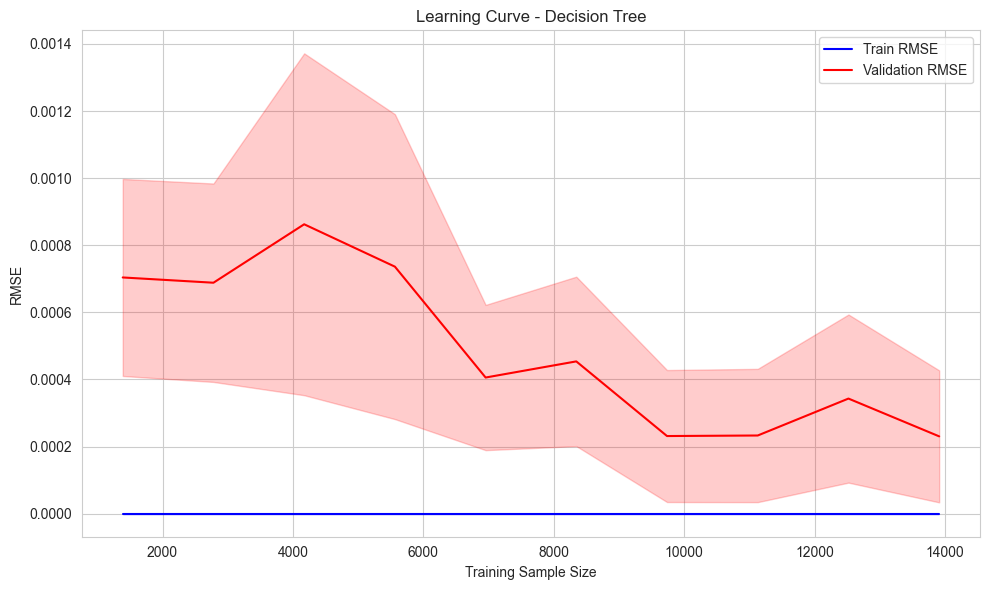


Evaluating Bagging (Decision Tree)
Train RMSE: 0.00524, Train R²: 0.95897
Validation RMSE: 0.01168, Validation R²: 0.85067
Test RMSE: 0.00280, Test R²: 0.70319
Bagging (Decision Tree) - ✅ Reasonable regularization: no strong over/underfitting detected.


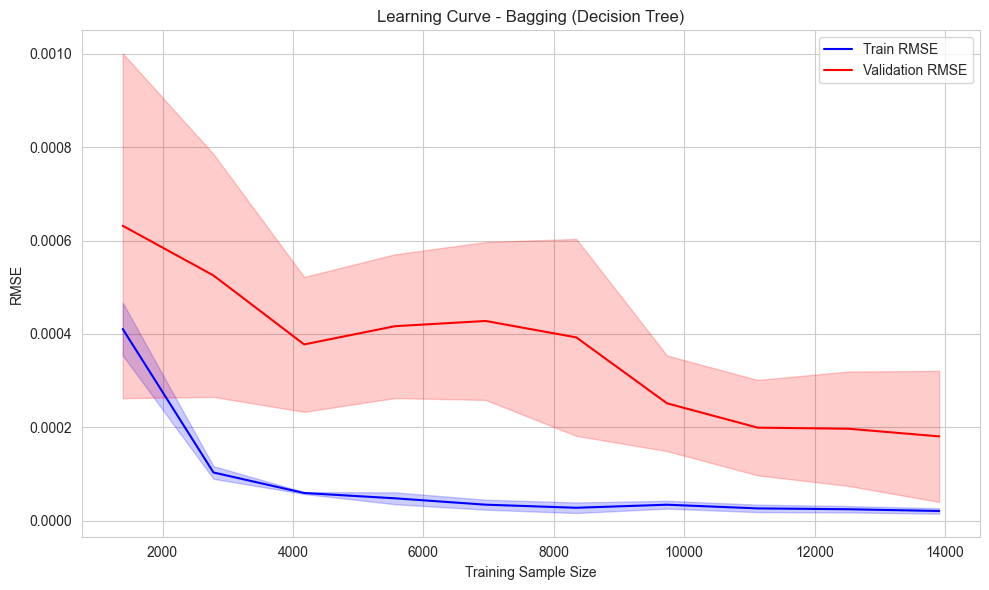


Evaluating Random Forest
Train RMSE: 0.00521, Train R²: 0.95944
Validation RMSE: 0.01186, Validation R²: 0.84610
Test RMSE: 0.00249, Test R²: 0.76480
Random Forest - ✅ Reasonable regularization: no strong over/underfitting detected.


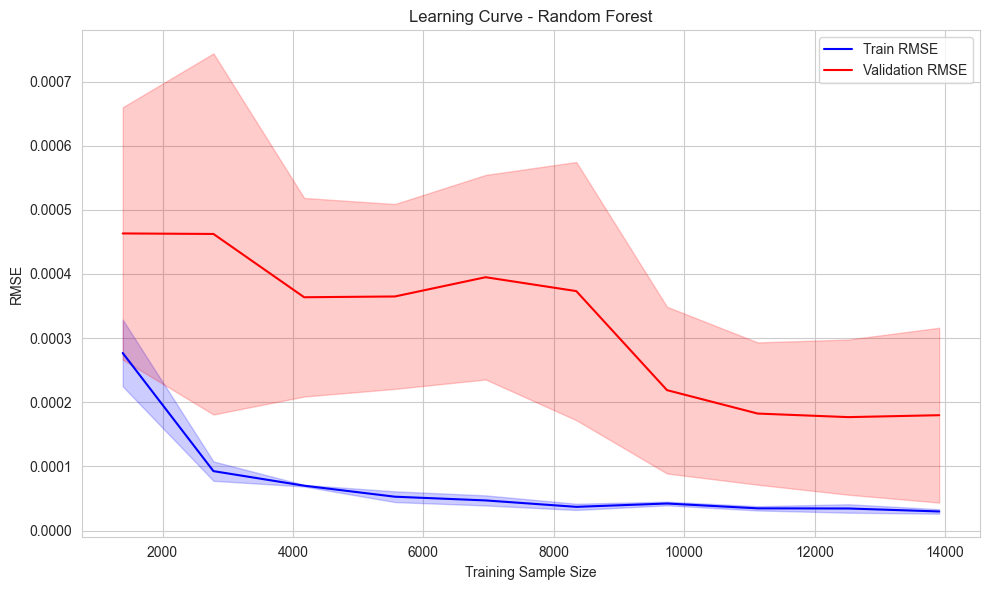


Evaluating Gradient Boosting
Train RMSE: 0.00076, Train R²: 0.99914
Validation RMSE: 0.00964, Validation R²: 0.89814
Test RMSE: 0.00157, Test R²: 0.90706
Gradient Boosting - ✅ Proper generalization: low and consistent RMSEs.


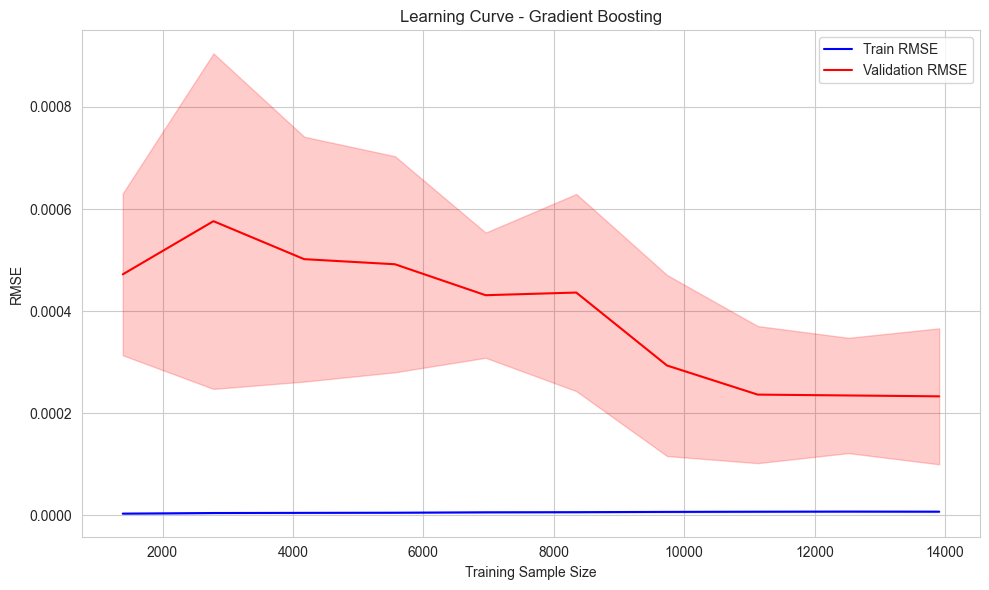


Evaluating XGBoost
Train RMSE: 0.00089, Train R²: 0.99882
Validation RMSE: 0.00243, Validation R²: 0.99354
Test RMSE: 0.00234, Test R²: 0.79317
XGBoost - ✅ Proper generalization: low and consistent RMSEs.


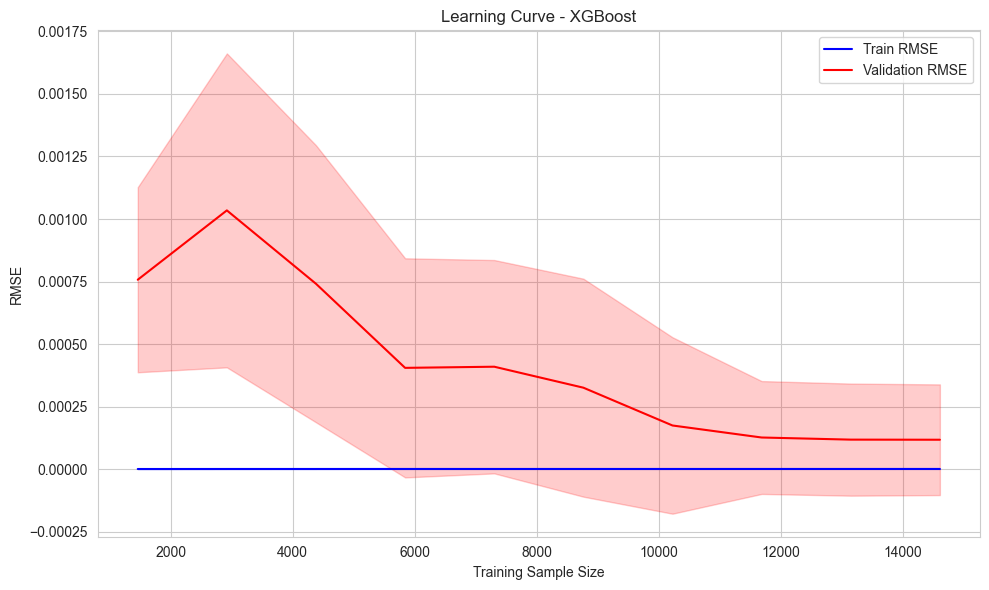

In [50]:
def check_overfitting(trained_models, X_train, y_train, X_val, y_val, X_test, y_test, best_cv_scores):
    for model_name, model in trained_models.items():
        print(f"\nEvaluating {model_name}")

        best_cv = best_cv_scores[model_name]

        # Predictions using the already trained model
        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)
        y_test_pred = model.predict(X_test)

        # Compute RMSE and R² scores
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

        train_r2 = r2_score(y_train, y_train_pred)
        val_r2 = r2_score(y_val, y_val_pred)
        test_r2 = r2_score(y_test, y_test_pred)

        print(f"Train RMSE: {train_rmse:.5f}, Train R²: {train_r2:.5f}")
        print(f"Validation RMSE: {val_rmse:.5f}, Validation R²: {val_r2:.5f}")
        print(f"Test RMSE: {test_rmse:.5f}, Test R²: {test_r2:.5f}")

        # Improved overfitting/underfitting/generalization analysis
        gap_train_val = abs(train_rmse - val_rmse)
        gap_train_test = abs(train_rmse - test_rmse)

        if train_rmse < 1.1 * val_rmse and train_rmse < 1.1 * test_rmse:
            if max(train_rmse, val_rmse, test_rmse) < 0.5:  # adjust threshold as needed
                print(f"{model_name} - ✅ Proper generalization: low and consistent RMSEs.")
            else:
                print(f"{model_name} - ⚠️ Slight underfitting: errors are similar but relatively high.")
        elif train_rmse < val_rmse and train_rmse < test_rmse:
            print(f"{model_name} - ⚠️ Underfitting: model performs equally poorly on all sets.")
        elif train_rmse > val_rmse and val_rmse > test_rmse:
            print(f"{model_name} - 🚨 Overfitting: much better on training than validation/test.")
        else:
            print(f"{model_name} - ✅ Reasonable regularization: no strong over/underfitting detected.")

        # Learning curve
        base_model = models_params[model_name]['model']

        train_sizes, train_scores, val_scores = learning_curve(
            base_model, X_train, y_train,
            cv=best_cv,
            scoring='neg_mean_squared_error',
            n_jobs=-1,
            train_sizes=np.linspace(0.1, 1.0, 10)
        )

        train_mean = np.mean(-train_scores, axis=1)
        val_mean = np.mean(-val_scores, axis=1)
        train_std = np.std(-train_scores, axis=1)
        val_std = np.std(-val_scores, axis=1)

        # Plot the learning curve
        plt.figure(figsize=(10, 6))
        plt.plot(train_sizes, train_mean, label="Train RMSE", color='blue')
        plt.plot(train_sizes, val_mean, label="Validation RMSE", color='red')

        plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color='blue', alpha=0.2)
        plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, color='red', alpha=0.2)

        plt.title(f"Learning Curve - {model_name}")
        plt.xlabel("Training Sample Size")
        plt.ylabel("RMSE")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

check_overfitting(trained_models, X_train, y_train, X_val, y_val, X_test, y_test, best_cv_scores)